<div style="background-color: #1DA1F2; padding: 20px;"><b><h1> Descifrando el lenguaje emocional en Twitter: Un análisis predictivo basado en aprendizaje automático. </h1></b></div>

**Autor**: Neivys Luz González Gómez

La identificación de emociones es una tarea fundamental en el campo del procesamiento de lenguaje natural, que se enfoca en clasificar textos según su tono emocional. A pesar de que el objetivo es identificar una amplia variedad de emociones humanas, la mayoría de los conjuntos de datos disponibles se limitan a las polaridades positiva, negativa y, en ocasiones, neutral.

Detectar emociones a partir de textos es un reto complejo en el procesamiento del lenguaje natural, ya que se trata de un problema de clasificación multiclase y, en muchas ocasiones, no hay suficientes datos etiquetados disponibles. Sin embargo, este conjunto de datos etiquetado proporciona la oportunidad de aplicar diversas técnicas de análisis exploratorio y modelado para entender mejor la dinámica emocional en las redes sociales y mejorar la capacidad de detección en tiempo real.

El conjunto de datos de emociones se obtiene a partir de mensajes en inglés de Twitter y contiene seis emociones básicas: neutralidad, preocupación, felicidad, tristeza, amor, sorpresa, diversión, alivio, odio, vacío, entusiasmo y aburrimiento. Este conjunto de datos ofrece una variedad más amplia de emociones humanas, lo que permite el entrenamiento y la evaluación de modelos de análisis de sentimientos con mayor precisión y exhaustividad.

<div class="alert alert-info alert-info"><b><h3>Objetivo General</h3></b>
    
**Desarrollar un modelo que permita detectar emociones en los tweets y analizar patrones en el lenguaje utilizado en Twitter para ayudar en la detección temprana de trastornos emocionales como la depresión, la ansiedad, entre otros.**
</div>

---

# Notebook N° 2: Análisis exploratorios de los datos

El notebook de análisis exploratorio es una herramienta fundamental en la consecución de nuestro objetivo general, el cual busca desarrollar un modelo que permita detectar emociones en los tweets y analizar patrones en el lenguaje utilizado en Twitter para ayudar en la detección temprana de trastornos emocionales como la depresión, la ansiedad, entre otros. 
Entre los objetvos específicos se encuentra realizar un análisis exploratorio de los datos, en donde se busca: 
* Visualización de los datos con el fin de descubrir patrones y tendencias que permitan comprender mejor el comportamiento de los usuarios en Twitter y la relación entre los términos y las emociones expresadas en los tweets.
* Identificar patrones y características relevantes para la detección de emociones, tales como las palabras más comunes asociadas con cada emoción y las tendencias de frecuencia de las emociones a lo largo del tiempo.

<div class="alert alert-block alert-warning">
<b><h1>Descripción de las Variables</h1></b> 
</div>

Se dispone de un conjunto de datos proveniente de data.world, una plataforma que proporciona acceso a conjuntos de datos públicos. Este dataset consiste en una colección de tweets etiquetados con la emoción que expresan. Contiene cuatro columnas que incluyen el identificador del tweet, el sentimiento expresado, el autor y el contenido del tweet. En total, se tienen 40,000 registros con anotaciones para 13 emociones distintas. 

| Variables 	|                           Descripción                           	|
|:---------:	|:---------------------------------------------------------------:	|
|  tweet_id 	| Identificador numérico único asignado a cada registro de tweet  	|
| sentiment 	|   Clasifica cada tweet en una de las 13 diferentes emociones.   	|
|   author  	|       Nombre del usuario de Twitter que publicó el tweet.       	|
|  content  	|                   El texto completo del tweet                   	|

---

In [1]:
#import libraries
import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from bs4 import BeautifulSoup
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import spacy
nlp = spacy.load("en_core_web_sm")

import re
import string

#import NLTK
import nltk
nltk.download('punkt') #Punkt es una biblioteca que se utiliza para tokenizar frases en lenguaje natural
nltk.download('stopwords') # library "stopwords"
nltk.download('wordnet') # 
nltk.download('omw-1.4') #
nltk.download('averaged_perceptron_tagger')
nltk.download('vader_lexicon') #Analysis with Vader

from nltk.tokenize import word_tokenize
from nltk.tokenize import sent_tokenize
from nltk.stem.wordnet import WordNetLemmatizer

#import librerias de frecuencias
from nltk.probability import FreqDist

#import librerias de pre-procesamiento y normalizacion
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.corpus import wordnet
from nltk.tag import pos_tag

#import librerias Sentiments
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from textblob import TextBlob
from nltk.tokenize import RegexpTokenizer

import warnings
warnings.filterwarnings('ignore')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\Lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\Lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\Lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already u

---

<div class="alert alert-block alert-info">
<b><h2> Cargar Dataset.</h2></b> 
</div>

In [2]:
emotion_data= pd.read_csv('text_emotion.csv')

In [3]:
emotion_data

,tweet_id,sentiment,author,content
0,1956967341,empty,xoshayzers,@tiffanylue i know i was listenin to bad habi...
1,1956967666,sadness,wannamama,Layin n bed with a headache ughhhh...waitin o...
2,1956967696,sadness,coolfunky,Funeral ceremony...gloomy friday...
3,1956967789,enthusiasm,czareaquino,wants to hang out with friends SOON!
4,1956968416,neutral,xkilljoyx,@dannycastillo We want to trade with someone w...
...,...,...,...,...
39995,1753918954,neutral,showMe_Heaven,@JohnLloydTaylor
39996,1753919001,love,drapeaux,Happy Mothers Day All my love
39997,1753919005,love,JenniRox,Happy Mother's Day to all the mommies out ther...
39998,1753919043,happiness,ipdaman1,@niariley WASSUP BEAUTIFUL!!! FOLLOW ME!! PEE...


<h3>Observaciones:</h3>

   * El dataset posee 40000 filas y 4 columnas. 
   * Se verificará los tipos las variables. 
   * Se verificará si hay valores nulos o NaN, así como si existen valores duplicados.  
   * Se verificaran los tipos de variables.
   * Se determinará las variables o atributos que utilizaran para la preparación de los modelos.

## 1. Preparación del Dataset

In [4]:
emotion_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   tweet_id   40000 non-null  int64 
 1   sentiment  40000 non-null  object
 2   author     40000 non-null  object
 3   content    40000 non-null  object
dtypes: int64(1), object(3)
memory usage: 1.2+ MB


### 1.1 Verificar nulos y NaM

In [5]:
emotion_data.isnull().sum()

tweet_id     0
sentiment    0
author       0
content      0
dtype: int64

In [6]:
emotion_data.isna().sum()

tweet_id     0
sentiment    0
author       0
content      0
dtype: int64

* Como se pueden observar no hay valores faltantes ni NAN en el dataset. Se realiza una gráfica msno, la cual es una manera visual de verificar la distribucción de los valores faltantes en un dataset. 

<AxesSubplot:>

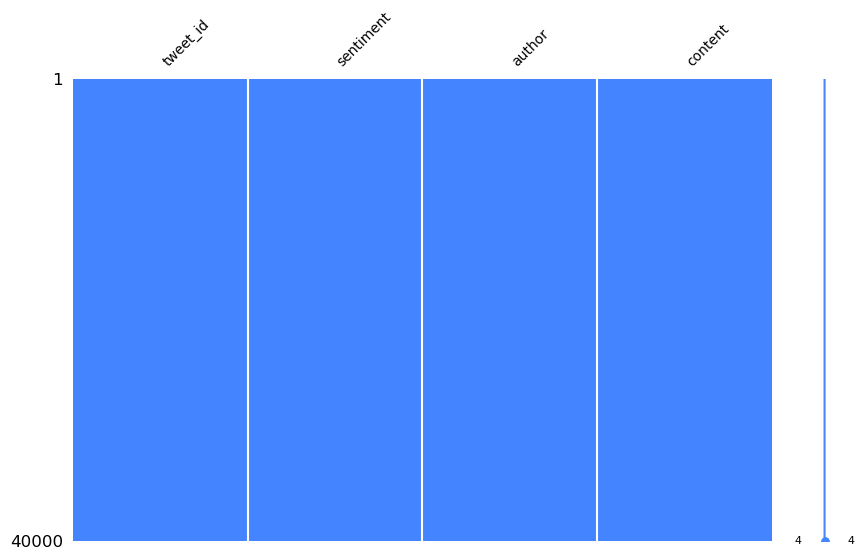

In [7]:
# show missing values and how they are distributed in the dataset.
import missingno as msno
msno.matrix(emotion_data, color=(0.27, 0.52, 1.0), figsize=(10,6),fontsize=(10))

### 1.2 Verificar datos duplicados

In [8]:
emotion_data[emotion_data.duplicated()]

,tweet_id,sentiment,author,content


### 1.3 Agregar nuevas columnas

* **Longitud de tweet**

Para la revsion exploratoria se creará una columna que permita medir la longitud de los tweet('content') para verificar si la longitud del tweet afecta en el tipo de emocion. 

In [9]:
emotion_data['review_length'] = emotion_data.content.apply(len)

In [10]:
emotion_data.head(10)

,tweet_id,sentiment,author,content,review_length
0,1956967341,empty,xoshayzers,@tiffanylue i know i was listenin to bad habi...,92
1,1956967666,sadness,wannamama,Layin n bed with a headache ughhhh...waitin o...,60
2,1956967696,sadness,coolfunky,Funeral ceremony...gloomy friday...,35
3,1956967789,enthusiasm,czareaquino,wants to hang out with friends SOON!,36
4,1956968416,neutral,xkilljoyx,@dannycastillo We want to trade with someone w...,86
5,1956968477,worry,xxxPEACHESxxx,Re-pinging @ghostridah14: why didn't you go to...,84
6,1956968487,sadness,ShansBee,"I should be sleep, but im not! thinking about ...",132
7,1956968636,worry,mcsleazy,Hmmm. http://www.djhero.com/ is down,36
8,1956969035,sadness,nic0lepaula,@charviray Charlene my love. I miss you,39
9,1956969172,sadness,Ingenue_Em,@kelcouch I'm sorry at least it's Friday?,42


* **Clasificacion de la columana sentiment**

Como entre las actividades planteadas esta comparar el sentimiento ya etiquetado con un analisis de sentimiento y verificar si existe alguna diferencia, se procedera a crear una columnan que clasificara la emoción en negativa, neutra o positiva, para que pueda ser comparable con los resultados del analisis de sentimiento.

In [11]:
emotion_data['sentiment'].value_counts(normalize=True)

neutral       0.215950
worry         0.211475
happiness     0.130225
sadness       0.129125
love          0.096050
surprise      0.054675
fun           0.044400
relief        0.038150
hate          0.033075
empty         0.020675
enthusiasm    0.018975
boredom       0.004475
anger         0.002750
Name: sentiment, dtype: float64

In [12]:
sentiment_map = {
    'enthusiasm': 'positive',
    'love': 'positive',
    'fun': 'positive',
    'happiness': 'positive',
    'relief': 'positive',
    'empty': 'negative',
    'sadness': 'negative',
    'worry': 'negative',
    'hate': 'negative',
    'surprise': 'negative',
    'boredom': 'negative',
    'anger': 'negative',
    'neutral': 'neutral'
}

def classify_sentiment(sentiment):
    return sentiment_map[sentiment]

emotion_data['classification_sentim'] = emotion_data['sentiment'].apply(classify_sentiment)

### 1.4 Cambiar nombre columana sentiment y cambiar orden de las columnas

In [13]:
# Renombrar la columna "sentiment" a "sentiment_label"
emotion_data = emotion_data.rename(columns={'sentiment': 'sentiment_label'})

In [14]:
# Reordenar las columnas 
emotion_data = emotion_data[['tweet_id', 'author', 'review_length', 'sentiment_label', 'classification_sentim', 'content']]
emotion_data

,tweet_id,author,review_length,sentiment_label,classification_sentim,content
0,1956967341,xoshayzers,92,empty,negative,@tiffanylue i know i was listenin to bad habi...
1,1956967666,wannamama,60,sadness,negative,Layin n bed with a headache ughhhh...waitin o...
2,1956967696,coolfunky,35,sadness,negative,Funeral ceremony...gloomy friday...
3,1956967789,czareaquino,36,enthusiasm,positive,wants to hang out with friends SOON!
4,1956968416,xkilljoyx,86,neutral,neutral,@dannycastillo We want to trade with someone w...
...,...,...,...,...,...,...
39995,1753918954,showMe_Heaven,16,neutral,neutral,@JohnLloydTaylor
39996,1753919001,drapeaux,30,love,positive,Happy Mothers Day All my love
39997,1753919005,JenniRox,123,love,positive,Happy Mother's Day to all the mommies out ther...
39998,1753919043,ipdaman1,122,happiness,positive,@niariley WASSUP BEAUTIFUL!!! FOLLOW ME!! PEE...


<h3>Observaciones:</h3>

   *  Se puede observar que el data set no tiene valores nulos o NaN. 
   *  Se puede observar que el data set no tiene valores duplicados.  
   *  Las variables de importancia para el estudio son del tipo objeto. 
   *  El dataset posee 40000 filas y 4 columnas.

## 2. Descripción estadística y visualización global de las variables.

In [15]:
emotion_data.describe(include = 'object').T

,count,unique,top,freq
author,40000,33871,MissxMarisa,23
sentiment_label,40000,13,neutral,8638
classification_sentim,40000,3,negative,18250
content,40000,39827,I just received a mothers day card from my lov...,14


En este proyecto, se ha analizado un conjunto de datos de 40,000 instancias que contienen información sobre autores, contenidos y sentimientos. De los 13 valores únicos presentes en la columna de sentimiento, la mayoría de las instancias (8,638) corresponden a un sentimiento neutral. En cuanto a los autores, se encontraron 33,871 valores únicos en la columna correspondiente, siendo el autor con mayor frecuencia la usuaria "MissxMarisa", con 23 apariciones en el conjunto de datos. Finalmente, se identificaron 39,827 valores únicos en la columna de contenido, siendo el mensaje más frecuente "I just received a mothers day card from my lov..." con una frecuencia de 14 apariciones.

### 2.1 Análisis Univariable

* **Distribución de las etiquetas en el conjunto de datos.**

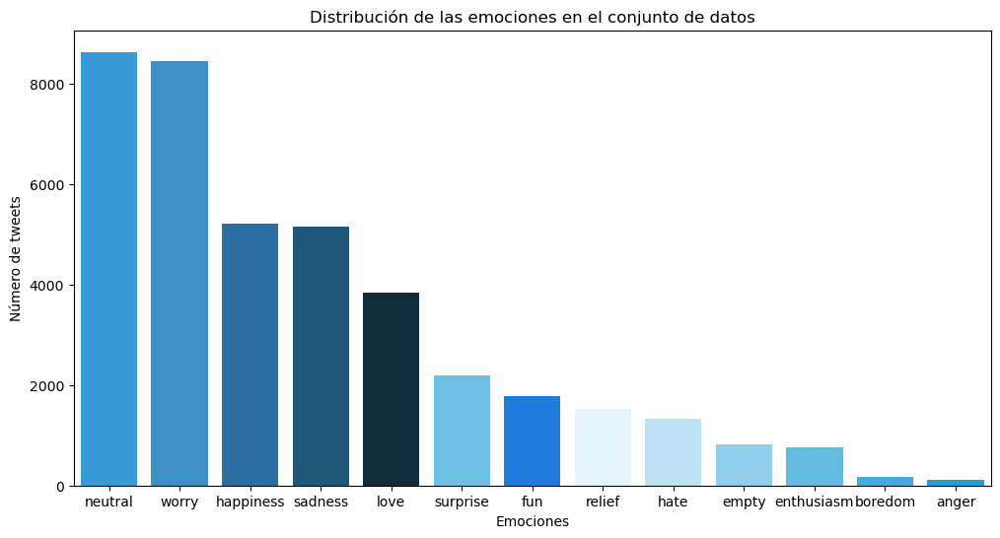

In [16]:
# Crear un colormap de azules de Twitter
cmap = sns.color_palette(['#1DA1F2', '#2795D9', '#1771B5', '#0D5C8B', '#073044', '#5AC8FA', '#007AFF', '#E1F5FE', '#B3E5FC', 
                          '#81D4FA', '#4FC3F7', '#29B6F6', '#03A9F4'])


# Contar el número de tweets por emoción
emotions_count = emotion_data['sentiment_label'].value_counts()

# Visualizar la distribución de las emociones
plt.figure(figsize=(12,6))
sns.barplot(x=emotions_count.index, y=emotions_count.values, palette=sns.color_palette(cmap))
plt.title('Distribución de las emociones en el conjunto de datos')
plt.xlabel('Emociones')
plt.ylabel('Número de tweets')

#salvar el grafico
plt.savefig('distemociones.png', dpi=300, figsize=(12,6))

plt.show()

El gráfico "Distribución de las emociones en el conjunto de datos" evidencia un desbalance significativo entre las etiquetas de emociones en el conjunto de datos. Las emociones "neutral" y "worry" representan la mayoría de los tweets con un 21 % cada uno sobre el dataset, mientras que las emociones "boredom" y "anger" son las menos representadas con un 0.4% y 0.2% respectivamente, lo que puede afectar negativamente el rendimiento de los algoritmos de machine learning utilizados para el análisis de sentimientos. El 21% de los tweet son neutrales o 

El desbalance de clases puede llevar a un sesgo hacia las clases dominantes, resultando en una clasificación incorrecta de las clases minoritarias. Si bien el entrenamiento con un conjunto de datos desbalanceado y la evaluación con uno equilibrado puede producir resultados pobres en la clasificación de las emociones minoritarias, la solución puede ser la recopilación de datos adicionales o el uso de técnicas de muestreo.

Existen algunas opciones para abordar el problema de desbalance de clases en el conjunto de datos:
* La primera es realizar una reclasificación de las emociones agrupando las emociones positivas, neutrales y negativas en cada clase, lo que podría reducir el desbalance y mejorar el rendimiento de los algoritmos de clasificación de sentimientos. 
* La segunda opción es aplicar análisis de sentimiento y polaridad a los tweets y utilizar estos resultados para realizar una reclasificación más precisa.

En conclusión, el desbalance de clases es un problema común en el análisis de sentimientos y es importante abordarlo cuidadosamente para obtener resultados precisos y confiables.

* **Análisis de estadísticas de texto**

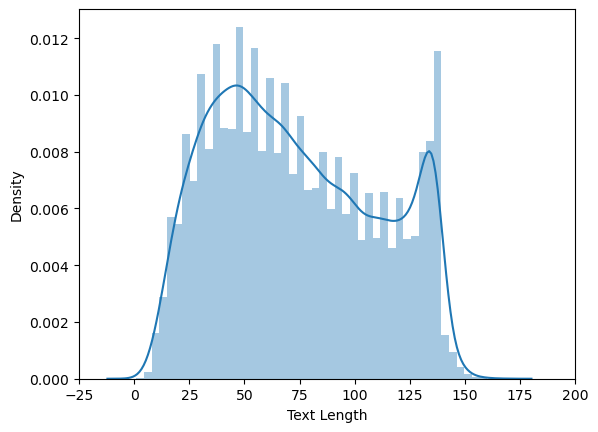

In [17]:
sns.distplot(emotion_data['review_length'])
plt.xlim([-25, 200]);
plt.xlabel('Text Length')

#salvar el grafico
plt.savefig('histlongitud.png', dpi=300, figsize=(12,6))

plt.show()

El histograma anterior muestra que la longitud del tweet oscila entre 0 y 175 caracteres. 

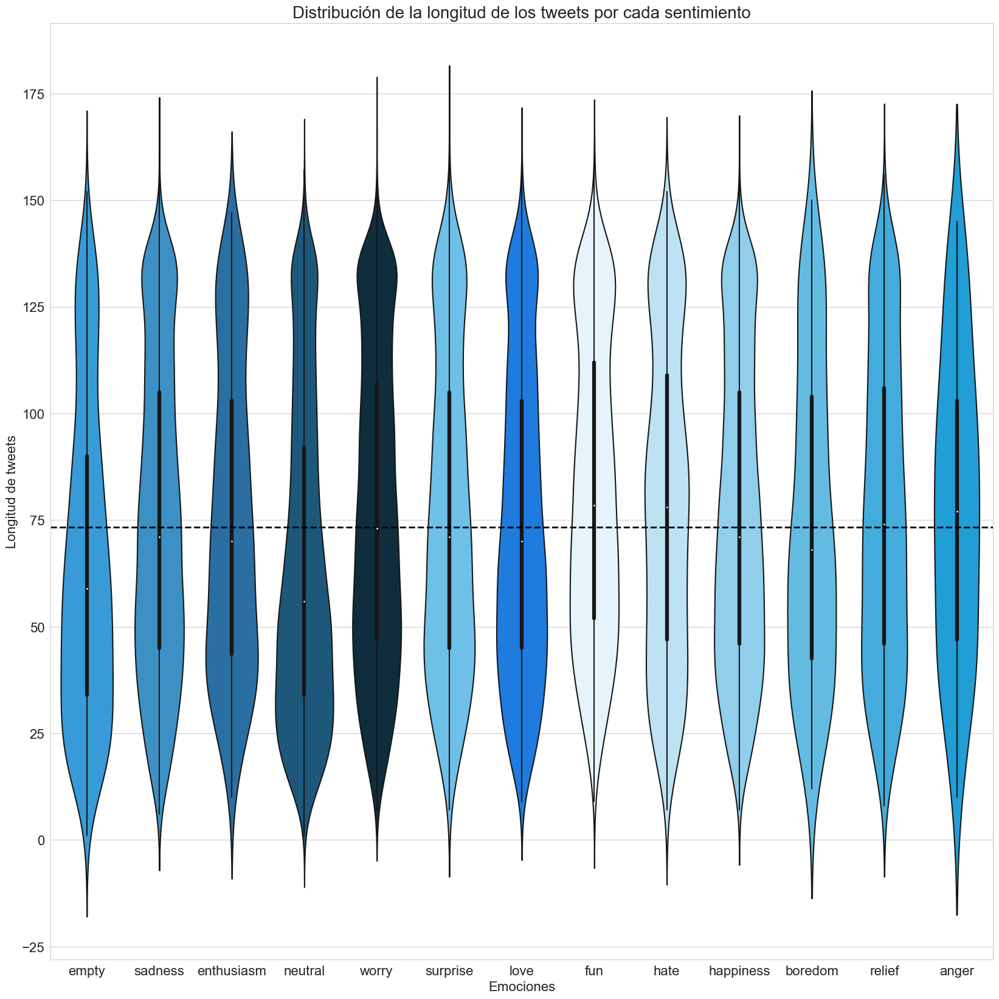

In [20]:
# Calcular la media de la longitud de los tweets
mean_length = emotion_data['review_length'].mean()

# Definir la paleta de colores de Twitter
cmap = sns.color_palette(['#1DA1F2', '#2795D9', '#1771B5', '#0D5C8B', '#073044', '#5AC8FA', '#007AFF', '#E1F5FE', '#B3E5FC', 
                          '#81D4FA', '#4FC3F7', '#29B6F6', '#03A9F4'])

# Configurar el estilo de Seaborn
sns.set_style('whitegrid')

# Generar el violinplot
sns.violinplot(x='sentiment_label', y='review_length', data=emotion_data, palette=cmap)

# Configurar el tamaño de la figura
plt.rcParams['figure.figsize'] = (20,20)
plt.rcParams.update({'font.size': 20})

# Agregar la línea horizontal en la posición de la media
plt.axhline(mean_length, color='black', linestyle='dashed', linewidth=2)

plt.title('Distribución de la longitud de los tweets por cada sentimiento', fontsize=20)
plt.xlabel('Emociones', fontsize=16)
plt.ylabel('Longitud de tweets', fontsize=16)

#salvar el grafico
plt.savefig('distlongitud.png', dpi=300, figsize=(14, 14))

# Mostrar el gráfico
plt.show()

El gráfico muestra la distribución de la longitud de los tweets para cada una de las emociones preclasificadas. En general, se puede observar que la longitud de los tweets es muy similar en todas las emociones, con una media general de 74 caracteres. Esto sugiere que la longitud del tweet no afecta significativamente la emoción expresada en el mismo.

Además, se puede apreciar que la mayoría de los tweets se concentran en la región central de los violinplots, lo que indica que la mayoría de los tweets tienen una longitud similar para cada una de las emociones preclasificadas.

También se ha utilizado una paleta de colores de Twitter para distinguir visualmente cada una de las emociones. Se ha agregado una línea horizontal que representa la media de la longitud de los tweets para que se pueda comparar fácilmente la distribución de cada emoción con la media general.

En general, este gráfico es útil para explorar la relación entre la longitud de los tweets y la emoción preclasificada, y sugiere que la longitud del tweet no es un factor crítico en la identificación de la emoción expresada en el mismo, es decir,  no es un poderoso indicador de polaridad.

### 2.2 Pre-procesamiento del tweet (Tokenizacion del tweet)

Dada la complejidad de la tarea de clasificación de emociones en el procesamiento del lenguaje natural, se requiere aplicar diferentes enfoques para crear modelos precisos. Uno de estos enfoques es el análisis de sentimientos, que implica utilizar técnicas de procesamiento de lenguaje natural para identificar y extraer información emocional de un texto.

En el caso particular de los tweets, se puede realizar un análisis de sentimientos para comparar los resultados obtenidos con la emoción asignada previamente en el conjunto de datos original. Para llevar a cabo este análisis, se utilizan diversas herramientas de procesamiento de lenguaje natural, como la tokenización, lematización y análisis sintáctico, que permiten identificar las emociones expresadas en el texto. Al aplicar esta técnica a los tweets y comparar los resultados con los datos etiquetados, se pueden mejorar la precisión y la efectividad de los modelos de clasificación de emociones.

In [21]:
def preprocess_tweet(tweet):
    # Eliminar menciones (@nombredeusuario) y URLs
    pat1 = r'@[A-Za-z0-9]+'
    pat2 = r'https?://[A-Za-z0-9./]+'
    combined_pat = r'|'.join((pat1, pat2))
    soup = BeautifulSoup(tweet, 'lxml')
    souped = soup.get_text()
    stripped = re.sub(combined_pat, '', souped)
    try:
        clean = stripped.decode("utf-8-sig").replace(u"\ufffd", "?")
    except:
        clean = stripped
    
    # Convertir el texto a minúsculas
    tweet = clean.lower()
    
    # Eliminar signos de puntuación
    tweet = re.sub('[%s]' % re.escape(string.punctuation), '', tweet)
    
    # Eliminar números
    tweet = re.sub(r'\d+', '', tweet)
    
    # Eliminar palabras comunes (stopwords)
    stop_words = set(stopwords.words('english')).union(set(['u', 'im', 'c', 'n']))
    words = tweet.split()
    words = [word for word in words if not word in stop_words]   
    
    # Lematización (reducir las palabras a su raíz)
    lemmatizer = WordNetLemmatizer()
    words = [lemmatizer.lemmatize(word) for word in words]
    tweet = ' '.join(words)
    
    return tweet

In [22]:
# Crea una nueva columna llamada "processed_tweet"
emotion_data['processed_tweet'] = ''

# Itera a través de cada tweet
for i, tweet in enumerate(emotion_data['content']):
    # Preprocesa el tweet
    processed_tweet = preprocess_tweet(tweet)
    
    # Almacena el tweet preprocesado en la nueva columna
    emotion_data.at[i, 'processed_tweet'] = processed_tweet

In [23]:
emotion_data.head(10)

,tweet_id,author,review_length,sentiment_label,classification_sentim,content,processed_tweet
0,1956967341,xoshayzers,92,empty,negative,@tiffanylue i know i was listenin to bad habi...,know listenin bad habit earlier started freaki...
1,1956967666,wannamama,60,sadness,negative,Layin n bed with a headache ughhhh...waitin o...,layin bed headache ughhhhwaitin call
2,1956967696,coolfunky,35,sadness,negative,Funeral ceremony...gloomy friday...,funeral ceremonygloomy friday
3,1956967789,czareaquino,36,enthusiasm,positive,wants to hang out with friends SOON!,want hang friend soon
4,1956968416,xkilljoyx,86,neutral,neutral,@dannycastillo We want to trade with someone w...,want trade someone houston ticket one
5,1956968477,xxxPEACHESxxx,84,worry,negative,Re-pinging @ghostridah14: why didn't you go to...,repinging didnt go prom bc bf didnt like friend
6,1956968487,ShansBee,132,sadness,negative,"I should be sleep, but im not! thinking about ...",sleep thinking old friend want he married damn...
7,1956968636,mcsleazy,36,worry,negative,Hmmm. http://www.djhero.com/ is down,hmmm
8,1956969035,nic0lepaula,39,sadness,negative,@charviray Charlene my love. I miss you,charlene love miss
9,1956969172,Ingenue_Em,42,sadness,negative,@kelcouch I'm sorry at least it's Friday?,sorry least friday


In [24]:
# Verificar si hay filas vacías en la columna 'columna'
if emotion_data['processed_tweet'].isnull().values.any():
    print('Hay filas vacías en la columna "columna"')
else:
    print('No hay filas vacías en la columna "columna"')

No hay filas vacías en la columna "columna"


* **Visualización de tokens** (Visualizar las palabras más comunes en los tweets )

In [25]:
from PIL import Image

#Función para transformar todas las imágenes PNG con fondo transparente a fondo blanco

def transform_white_backgroud(png_path):
    picture = Image.open(png_path).convert("RGBA")
    image = Image.new("RGB", picture.size, "WHITE")
    image.paste(picture, (0, 0), picture)

    plt.imshow(image)
    
    mask = np.array(image)
    
    return mask

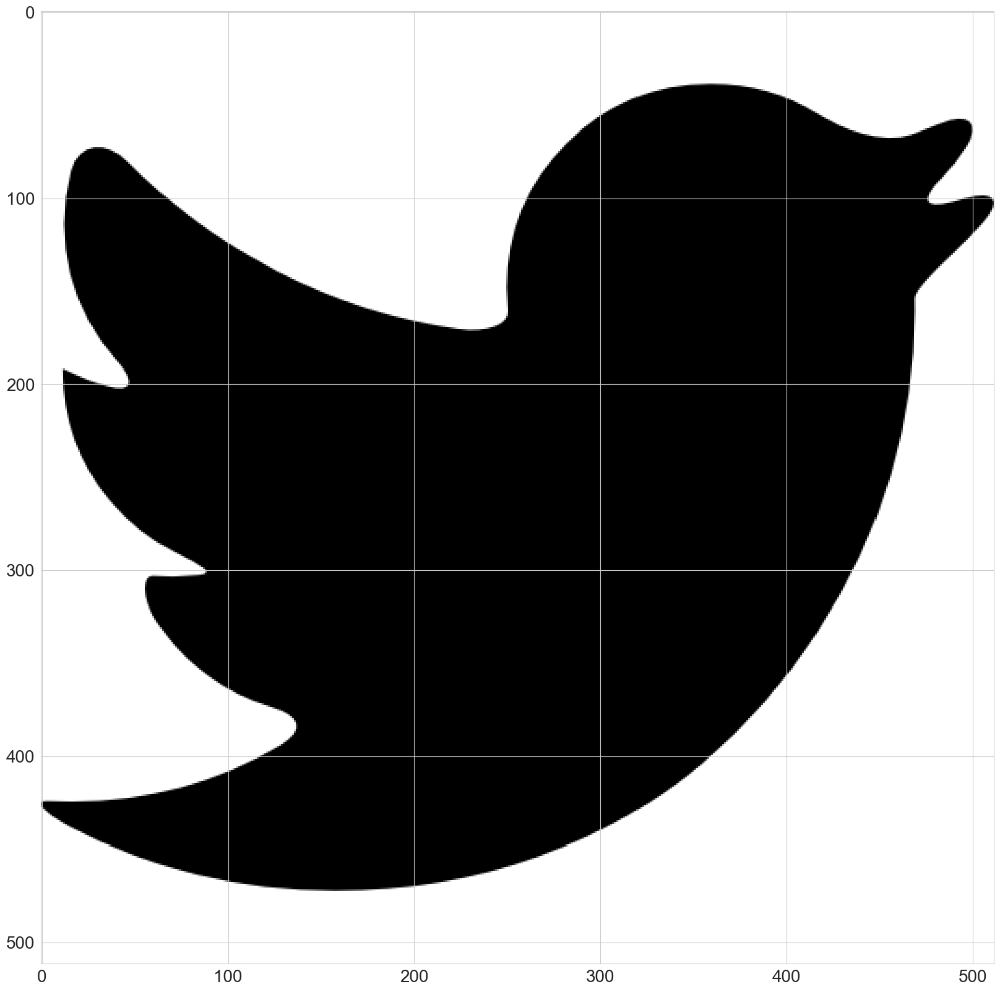

In [26]:
mask = transform_white_backgroud('tweet.png')

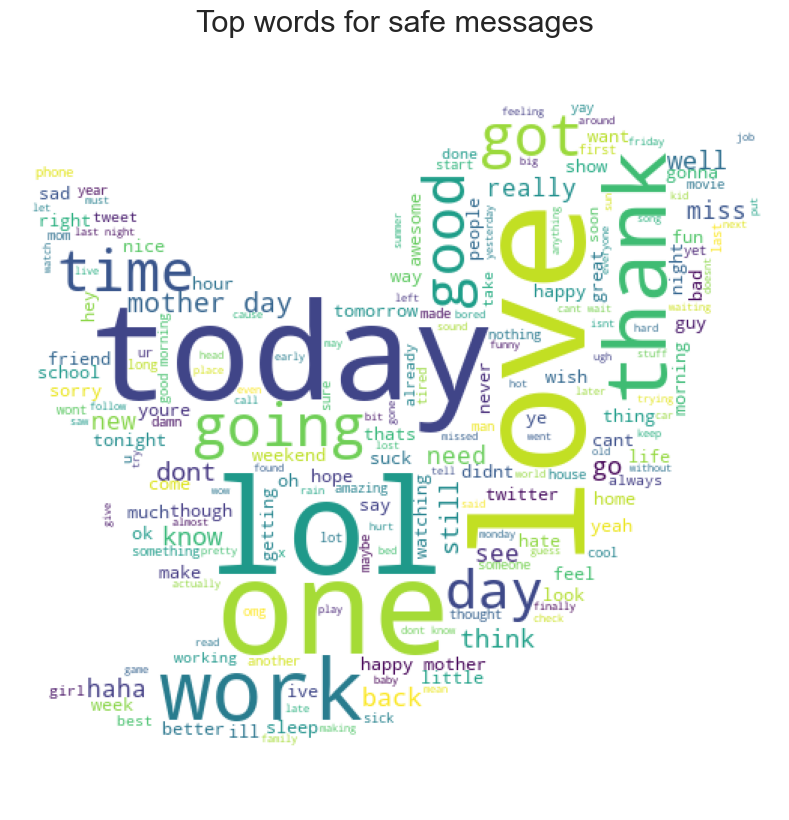

In [27]:
# Extracting the twitter word cloud mask
wc = WordCloud(background_color='white', max_words=200, mask=mask)

wc.generate(' '.join(processed_tweet for processed_tweet in emotion_data.processed_tweet))

wc.to_file('tweet2.png') #Guardamos la imagen generada

plt.figure(figsize=(15, 10))
plt.title('Top words for safe messages', fontdict={'size':22})
plt.imshow(wc)
plt.axis('off')
plt.show()

En la nube de palabras que se muestra, podemos notar que hay una mayor cantidad de palabras positivas como Love, Thank, One, Lol, Good, entre otras, que las que se observan en el gráfico de distribución de las emociones. Esto resalta la importancia de realizar un análisis de sentimientos para validar la precisión de las etiquetas de emociones en el conjunto de datos original. 

Aunque las etiquetas pueden haber sido asignadas con buena intención, es posible que existan casos en los que se hayan clasificado mal algunas emociones. Un análisis de sentimientos puede ayudarnos a determinar la polaridad de cada tweet y asignar la emoción correspondiente de manera más precisa. Esto es fundamental para poder realizar un análisis exhaustivo y preciso de los datos, y obtener resultados confiables y significativos.

* **Mostrar la transición de una emoción a otra**

Un gráfico de Sankey se utiliza para mostrar la transición de una emoción a otra, es decir, la cantidad de veces que una emoción cambia a otra. Este tipo de gráfico es muy útil para visualizar patrones de comportamiento y para comprender mejor las relaciones entre diferentes emociones.

En un gráfico de Sankey, las emociones se representan como nodos y las transiciones entre ellas se representan mediante flechas que indican la dirección del cambio de una emoción a otra. Cada flecha tiene un grosor proporcional a la cantidad de veces que ocurre la transición en el conjunto de datos. De esta manera, es posible identificar rápidamente las transiciones más frecuentes y comprender cómo se relacionan las diferentes emociones entre sí.

In [28]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from collections import Counter
import plotly.io as pio

# enable the Plotly notebook mode
pio.renderers.default = "notebook"
# contar las palabras más comunes por emoción
emotions = emotion_data['sentiment_label'].unique()
word_counts = {}

for emotion in emotions:
    subset = emotion_data[emotion_data['sentiment_label'] == emotion]
    words = subset['processed_tweet'].str.cat(sep=' ').lower().split()
    word_counts[emotion] = Counter(words)

# crear tabla de frecuencias de palabras
word_freq = pd.DataFrame(word_counts).fillna(0).T

# normalizar la tabla de frecuencias de palabras para que las frecuencias sumen 1
word_freq = word_freq.divide(word_freq.sum(axis=1), axis=0)

# crear matriz de transición
emotions_list = list(emotions)
n_emotions = len(emotions_list)
transition_matrix = pd.DataFrame(index=emotions_list, columns=emotions_list)

for i, row in enumerate(emotions_list):
    for j, col in enumerate(emotions_list):
        if i == j:
            transition_matrix.iloc[i,j] = 0
        else:
            common_words = set(word_counts[row].keys()).intersection(set(word_counts[col].keys()))
            transition_matrix.iloc[i,j] = sum(word_freq.loc[row, common_words])

# graficar el diagrama de Sankey
from plotly import graph_objs as go

source = ['neutral', 'neutral', 'worry', 'worry', 'happiness', 'happiness', 'sadness', 'sadness', 'love', 'love', 'surprise', 'surprise', 'fun', 'fun', 'relief', 'relief', 'hate', 'hate', 'empty', 'empty', 'enthusiasm', 'enthusiasm', 'boredom', 'boredom', 'anger']
target = ['happiness', 'sadness', 'happiness', 'sadness', 'love', 'fun', 'love', 'fun', 'surprise', 'relief', 'surprise', 'relief', 'hate', 'empty', 'hate', 'empty', 'enthusiasm', 'boredom', 'enthusiasm', 'boredom', 'neutral', 'worry', 'neutral', 'worry', 'neutral']
value = [transition_matrix.loc[source[i], target[i]] for i in range(n_emotions)]

fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = 0.5),
      label = emotions_list,
      color = "blue"
    ),
    link = dict(
      source = source,
      target = target,
      value = value
  ))])

fig.update_layout(title_text="Diagrama de Sankey de emociones y palabras en Tweets")
fig.show(renderer="notebook")

## 3. Análisis de sentimiento

El análisis de sentimientos puede ayudarn a determinar la polaridad de cada tweet y asignar la emoción correspondiente de manera más precisa. Esto es fundamental para poder realizar un análisis exhaustivo y preciso de los datos, y obtener resultados confiables y significativos

### 3.1 Analisis de sentimiento con Text Blob

TextBlob es una opción popular y fácil de usar para análisis de sentimiento en Python. Con una sintaxis sencilla, se puede obtener la polaridad, subjetividad y sentimiento de un texto en cuestión de segundos. Además, TextBlob cuenta con herramientas adicionales como etiquetado de partes del discurso, traducción y corrección ortográfica, lo que lo convierte en una herramienta útil para diversas aplicaciones de procesamiento de lenguaje natural.

In [29]:
def calculate_sentiment(tweet):
    blob = TextBlob(tweet)
    return {
        "polarity": blob.sentiment.polarity,
        "subjectivity": blob.sentiment.subjectivity,
        "sentiment_Blob": "positive" if blob.sentiment.polarity > 0.30 else "negative" if blob.sentiment.polarity < -0.30 else "neutral"
    }

In [30]:
sentiment_data_blob = emotion_data['processed_tweet'].apply(calculate_sentiment).apply(pd.Series)

In [31]:
emotion_data = pd.concat([emotion_data, sentiment_data_blob], axis=1)
emotion_data

,tweet_id,author,review_length,sentiment_label,classification_sentim,content,processed_tweet,polarity,subjectivity,sentiment_Blob
0,1956967341,xoshayzers,92,empty,negative,@tiffanylue i know i was listenin to bad habi...,know listenin bad habit earlier started freaki...,-0.350000,0.583333,negative
1,1956967666,wannamama,60,sadness,negative,Layin n bed with a headache ughhhh...waitin o...,layin bed headache ughhhhwaitin call,0.000000,0.000000,neutral
2,1956967696,coolfunky,35,sadness,negative,Funeral ceremony...gloomy friday...,funeral ceremonygloomy friday,0.000000,0.000000,neutral
3,1956967789,czareaquino,36,enthusiasm,positive,wants to hang out with friends SOON!,want hang friend soon,0.000000,0.000000,neutral
4,1956968416,xkilljoyx,86,neutral,neutral,@dannycastillo We want to trade with someone w...,want trade someone houston ticket one,0.000000,0.000000,neutral
...,...,...,...,...,...,...,...,...,...,...
39995,1753918954,showMe_Heaven,16,neutral,neutral,@JohnLloydTaylor,,0.000000,0.000000,neutral
39996,1753919001,drapeaux,30,love,positive,Happy Mothers Day All my love,happy mother day love,0.650000,0.800000,positive
39997,1753919005,JenniRox,123,love,positive,Happy Mother's Day to all the mommies out ther...,happy mother day mommy woman man long youre mo...,0.375000,0.700000,positive
39998,1753919043,ipdaman1,122,happiness,positive,@niariley WASSUP BEAUTIFUL!!! FOLLOW ME!! PEE...,wassup beautiful follow peep new hit single ww...,0.304978,0.556277,positive


In [32]:
# Obtener el conteo normalizado de classification_sentim y sentiment
classification_sentim_count = emotion_data['classification_sentim'].value_counts(normalize=True)
sentiment_count = emotion_data['sentiment_Blob'].value_counts(normalize=True)

# Crear un DataFrame con los datos
df = pd.DataFrame({'classification_sentim': classification_sentim_count, 'sentiment_Blob': sentiment_count})

# Mostrar el DataFrame
df.head()

,classification_sentim,sentiment_Blob
negative,0.45625,0.095550
neutral,0.21595,0.659825
positive,0.32780,0.244625


La columna "classification_sentim" representa la distribución de las emociones que se encontraron en el conjunto de datos original, calculada a través del conteo de los valores en la columna "classification_sentim". Los resultados muestran que el 45.625% de las emociones fueron clasificadas como "negative", el 21.595% como "neutral" y el 32.780% como "positive".

La columna "sentiment" representa la distribución de las emociones encontradas en el análisis de sentimiento, también calculada a través del conteo de valores en la columna "sentiment". Los resultados muestran que el 19.4225% de las emociones analizadas fueron clasificadas como "negative", el 36.3675% como "neutral" y el 44.21% como "positive".

En general, estos resultados sugieren que la clasificación de emociones del conjunto de datos original no está completamente en línea con las emociones identificadas en el análisis de sentimiento. Por ejemplo, el análisis de sentimiento encontró una mayor proporción de emociones "positive" en comparación con la clasificación original, mientras que la clasificación original encontró una mayor proporción de emociones "negative". 

Se mostrará graficamente para tener un mejor entendimiento de lo mostrado en la tabla.

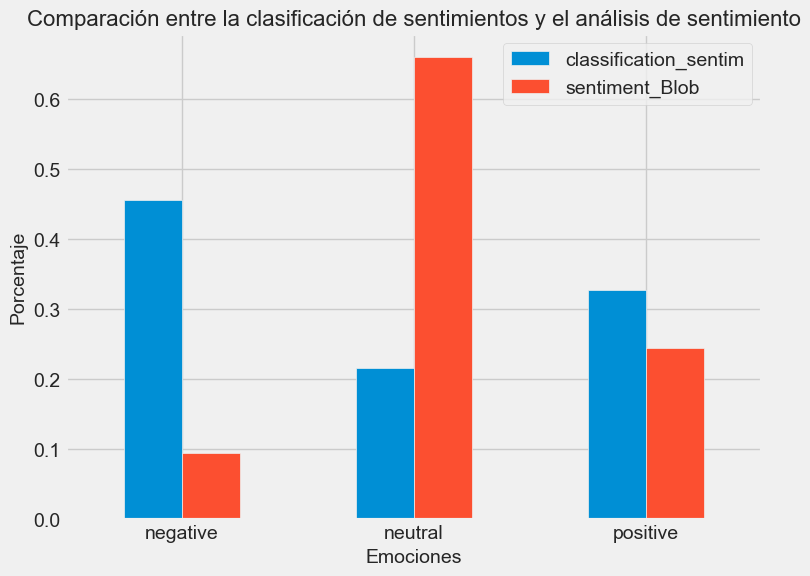

In [33]:
# Establecer el estilo de gráficos como "fivethirtyeight"
plt.style.use('fivethirtyeight')

# Crear una figura y un eje para el gráfico
fig, ax = plt.subplots(figsize=(8, 6))

# Crear el gráfico de barras con las dos columnas del dataframe
df.plot(kind='bar', ax=ax)

ax.set_title('Comparación entre la clasificación de sentimientos y el análisis de sentimiento', fontsize=16)
ax.set_xlabel('Emociones', fontsize=14)
ax.set_ylabel('Porcentaje', fontsize=14)

# establece las etiquetas del eje X en horizontal
plt.xticks(rotation=0, horizontalalignment='center')

# Establecer la paleta de colores de Twitter
sns.set_palette('Set2')

#salvar el grafico
plt.savefig('comparacion.png', dpi=300, figsize=(12,6))

# Mostrar el gráfico
plt.show()

<AxesSubplot:xlabel='polarity', ylabel='subjectivity'>

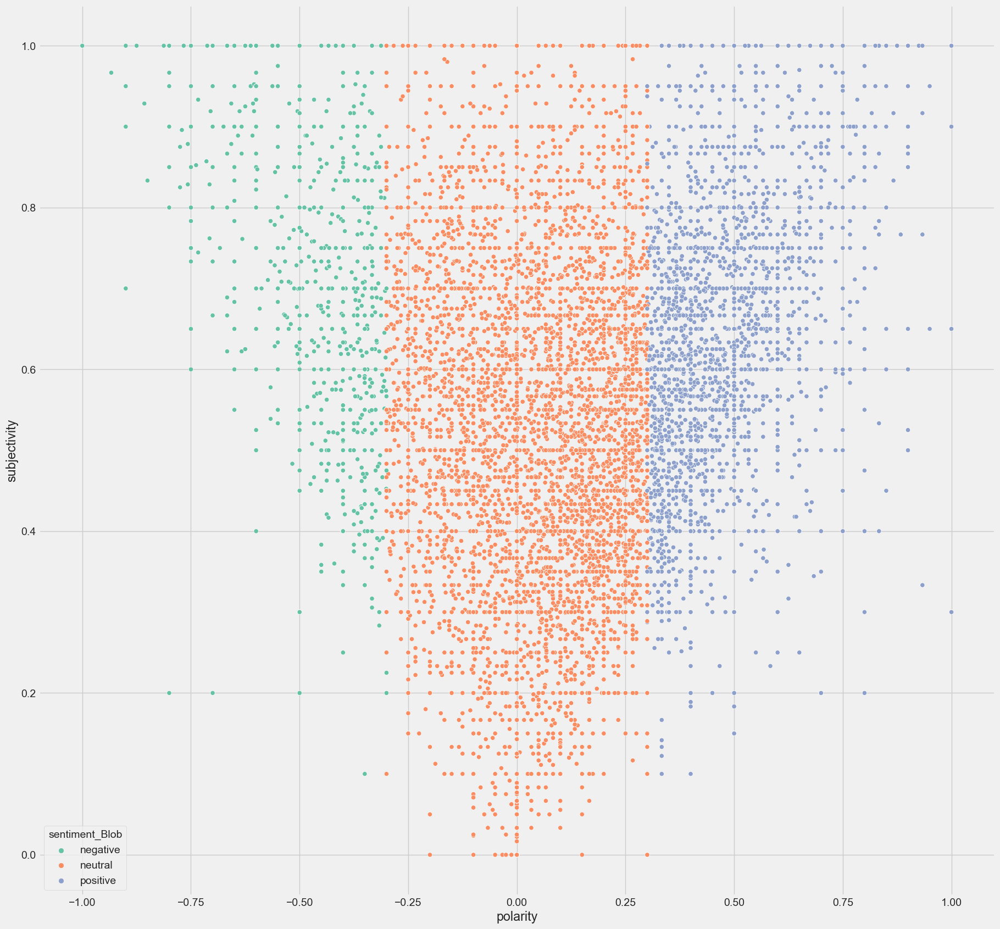

In [34]:
sns.scatterplot(x='polarity', y='subjectivity', hue='sentiment_Blob', data=emotion_data)

El gráfico muestra la distribución de polaridad de un conjunto de tweet analizados mediante una técnica de análisis de sentimiento. Se puede observar que la mayoría de los tweet tienen una polaridad positivo. Por otro lado, la polaridad negativa y la neutral son menos frecuentes en el conjunto de los tweet analizados. 

### 3.2 Analisis de sentimiento con VADER (Valence Aware Dictionary and sEntiment Reasoner)

Dado que la clasificación original de las emociones encontró una mayor proporción de emociones "negative", mientras que el análisis de sentimiento por TextBlob encontró una mayor proporción de emociones "positive", realizaré un análisis de sentimiento con otra técnica, como Vader. Vader es una herramienta de análisis de sentimiento diseñada específicamente para analizar el lenguaje coloquial, como los tweets. 

Comparando los resultados de ambas técnicas, podré identificar cuál de ellas es la más adecuada para continuar con los modelos de clasificación. El análisis de sentimiento basado en reglas, como Vader, puede funcionar bien en textos cortos como los tweets, debido a que está diseñado para analizar el lenguaje informal y el uso de emoticonos.

In [35]:
def calculate_vader_sentiment(tweet):
    analyzer = SentimentIntensityAnalyzer()
    vs = analyzer.polarity_scores(tweet)
    return {
        "positive": vs["pos"],
        "neutral": vs["neu"],
        "negative": vs["neg"],
        "compound": vs["compound"],
        "sentiment_vader": "positive" if vs["compound"] > 0.3 else "negative" if vs["compound"] < -0.3 else "neutral"
    }

In [36]:
# Aplica la función calculate_vader_sentiment a la columna processed_tweet de emotion_data
sentiment_data_blob = emotion_data['processed_tweet'].apply(calculate_vader_sentiment)

In [37]:
# Convierte el resultado en columnas usando json_normalize
sentiment_data_blob= pd.json_normalize(sentiment_data_blob)

In [38]:
# Une sentiment_data a emotion_data
emotion_data = pd.concat([emotion_data, sentiment_data_blob], axis=1)
emotion_data.head(10) 

,tweet_id,author,review_length,sentiment_label,classification_sentim,content,processed_tweet,polarity,subjectivity,sentiment_Blob,positive,neutral,negative,compound,sentiment_vader
0,1956967341,xoshayzers,92,empty,negative,@tiffanylue i know i was listenin to bad habi...,know listenin bad habit earlier started freaki...,-0.350,0.583333,negative,0.000,0.667,0.333,-0.5423,negative
1,1956967666,wannamama,60,sadness,negative,Layin n bed with a headache ughhhh...waitin o...,layin bed headache ughhhhwaitin call,0.000,0.000000,neutral,0.000,1.000,0.000,0.0000,neutral
2,1956967696,coolfunky,35,sadness,negative,Funeral ceremony...gloomy friday...,funeral ceremonygloomy friday,0.000,0.000000,neutral,0.000,0.444,0.556,-0.3612,negative
3,1956967789,czareaquino,36,enthusiasm,positive,wants to hang out with friends SOON!,want hang friend soon,0.000,0.000000,neutral,0.692,0.308,0.000,0.5423,positive
4,1956968416,xkilljoyx,86,neutral,neutral,@dannycastillo We want to trade with someone w...,want trade someone houston ticket one,0.000,0.000000,neutral,0.206,0.794,0.000,0.0772,neutral
5,1956968477,xxxPEACHESxxx,84,worry,negative,Re-pinging @ghostridah14: why didn't you go to...,repinging didnt go prom bc bf didnt like friend,0.000,0.000000,neutral,0.000,0.596,0.404,-0.5773,negative
6,1956968487,ShansBee,132,sadness,negative,"I should be sleep, but im not! thinking about ...",sleep thinking old friend want he married damn...,0.175,0.225000,neutral,0.343,0.296,0.361,-0.3182,negative
7,1956968636,mcsleazy,36,worry,negative,Hmmm. http://www.djhero.com/ is down,hmmm,0.000,0.000000,neutral,0.000,1.000,0.000,0.0000,neutral
8,1956969035,nic0lepaula,39,sadness,negative,@charviray Charlene my love. I miss you,charlene love miss,0.500,0.600000,positive,0.618,0.147,0.235,0.5574,positive
9,1956969172,Ingenue_Em,42,sadness,negative,@kelcouch I'm sorry at least it's Friday?,sorry least friday,-0.400,0.700000,negative,0.000,0.606,0.394,-0.0772,neutral


In [39]:
sentiment_varder_count = emotion_data['sentiment_vader'].value_counts(normalize=True)
sentiment_varder_count

neutral     0.42555
positive    0.41090
negative    0.16355
Name: sentiment_vader, dtype: float64

In [40]:
# Crear un DataFrame con los datos
df_final = pd.DataFrame({'classification_sentim': classification_sentim_count, 'sentiment_Blob': sentiment_count, 'sentiment_vader':sentiment_varder_count })

In [41]:
df_final.head()

,classification_sentim,sentiment_Blob,sentiment_vader
negative,0.45625,0.095550,0.16355
neutral,0.21595,0.659825,0.42555
positive,0.32780,0.244625,0.41090


En este caso, se observa que la clasificación de VADER difiere ligeramente de la evaluación manual y de la clasificación de TextBlob. Por ejemplo, el análisis de VADER clasifica un mayor porcentaje de tweets como positivos que la clasificación manual y la clasificación de TextBlob. 

Esto puede deberse a que VADER utiliza un enfoque diferente para evaluar el sentimiento de los tweets en comparación con TextBlob y puede ser más adecuado para algunos conjuntos de datos en particular. Es importante tener en cuenta que ningún algoritmo de análisis de sentimientos es perfecto y siempre se deben realizar evaluaciones manuales para asegurarse de que los resultados sean precisos.

Se mostrará graficamente para tener un mejor entendimiento de lo mostrado en la tabla.

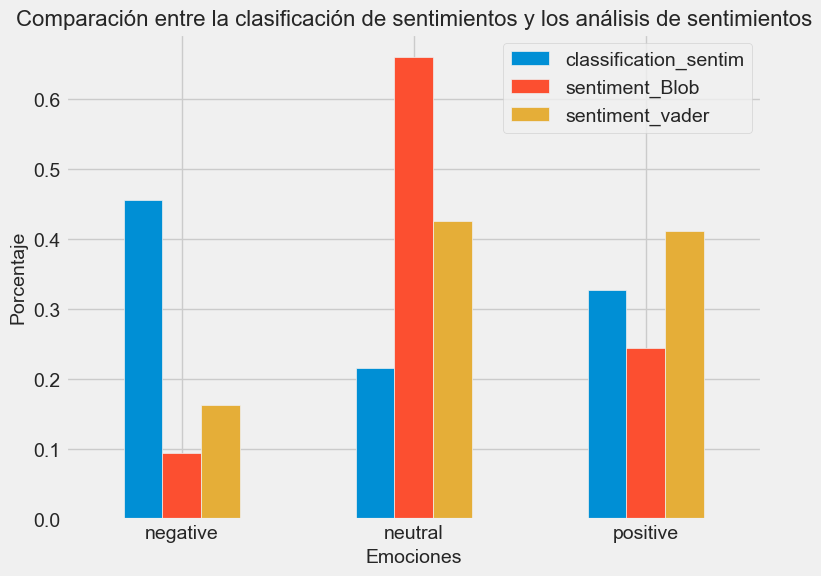

In [42]:
# Establecer el estilo de gráficos como "fivethirtyeight"
plt.style.use('fivethirtyeight')

# Crear una figura y un eje para el gráfico
fig, ax = plt.subplots(figsize=(8, 6))

# Crear el gráfico de barras con las dos columnas del dataframe
df_final.plot(kind='bar', ax=ax)

ax.set_title('Comparación entre la clasificación de sentimientos y los análisis de sentimientos', fontsize=16)
ax.set_xlabel('Emociones', fontsize=14)
ax.set_ylabel('Porcentaje', fontsize=14)

# establece las etiquetas del eje X en horizontal
plt.xticks(rotation=0, horizontalalignment='center')

# Establecer la paleta de colores de Twitter
sns.set_palette('Set2')

#salvar el grafico
plt.savefig('comparacion2.png', dpi=300, figsize=(12,6))

# Mostrar el gráfico
plt.show()

El gráfico muestra la comparación entre la clasificación de sentimientos realizada por evaluación manual, VADER y TextBlob. El eje y representa el porcentaje de tweets clasificados en cada categoría de sentimiento: positivo, neutral y negativo. Se puede observar que la clasificación de VADER difiere ligeramente de la evaluación manual y de la clasificación de TextBlob, ya que clasifica un mayor porcentaje de tweets como positivos. Esto sugiere que VADER puede ser más adecuado para algunos conjuntos de datos en particular y que es importante realizar evaluaciones manuales para asegurarse de que los resultados sean precisos. 

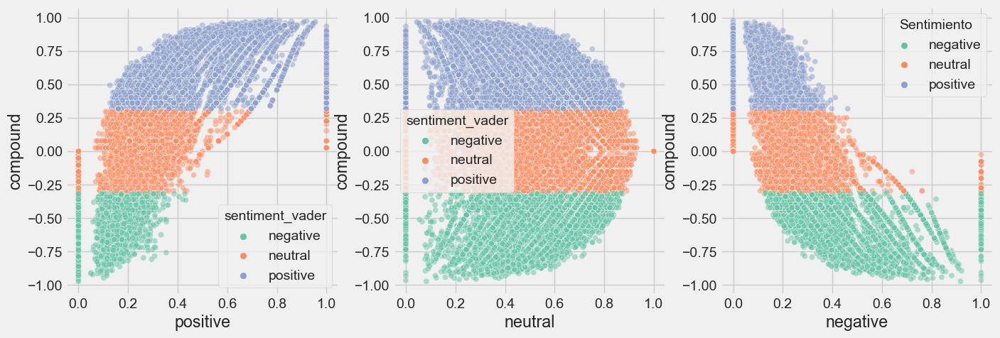

In [43]:
# Crear el subplot
fig, ax = plt.subplots(1,3, figsize=(15,5))

# Graficar los puntos para cada categoría de sentimiento
sns.scatterplot(x='positive', y='compound', hue='sentiment_vader', data=emotion_data, alpha=0.5, ax=ax[0])
sns.scatterplot(x='neutral', y='compound', hue='sentiment_vader', data=emotion_data, alpha=0.5, ax=ax[1])
sns.scatterplot(x='negative', y='compound', hue='sentiment_vader', data=emotion_data, alpha=0.5, ax=ax[2])

# Agregar leyenda
plt.legend(title='Sentimiento') #loc='upper left'# 

# Mostrar el gráfico
plt.show()

Este gráfico muestra la relación entre la polaridad y la subjetividad de los textos clasificados según su sentimiento. La polaridad es un valor que indica si un texto tiene una connotación positiva o negativa, mientras que la subjetividad indica en qué medida el texto es objetivo o subjetivo.

Los datos se dividen en tres subgráficos correspondientes a los sentimientos positivo, neutral y negativo. En cada subgráfico, los puntos representan los textos y su posición en el gráfico se basa en los valores de polaridad y subjetividad del texto. El color de los puntos representa el sentimiento asignado al texto según el algoritmo de análisis de sentimiento utilizado.

Al observar los subgráficos, se puede notar que en general, los textos con polaridad positiva tienen una mayor subjetividad que los textos con polaridad negativa o neutral. Además, los textos con polaridad negativa parecen estar más concentrados en la parte inferior del gráfico, lo que indica que tienden a ser más objetivos que subjetivos.

### 3.3 Análisis de las palabras mas frecuentes en cada emoción.

Este analisis lo realizaré con la clasificación de las emociones ya establecidas en el dataset original, las 13 emociones y luego con la clasificacion por Vader. Existe diferentes maneras para realizar este analisis, uno seria hacer un conteo de frecuencia de palabras.

* **Emociones del dataset original**

In [44]:
import collections

# Crear un diccionario para almacenar las palabras más comunes asociadas con cada emoción
emotions_words_c = {}
for sentiment_label in emotion_data['sentiment_label'].unique():
    emotions_words_c[sentiment_label] = []

# Iterar sobre cada fila del conjunto de datos
for index, row in emotion_data.iterrows():
    # Verificar si la emoción de la fila actual coincide con una emoción en emotions_words
    if row['sentiment_label'] in emotions_words_c:
        # Verificar si la columna 'processed_tweet' no está vacía
        if isinstance(row['processed_tweet'], str):
            # Dividir la columna processed_tweet en palabras
            words_c = row['processed_tweet'].lower().split()
            # Contar la frecuencia de cada palabra en la lista de palabras
            counter_c = collections.Counter(words_c)
            # Obtener las 10 palabras más comunes y agregarlas a emotions_words
            for word_c, count in counter_c.most_common(10):
                if len(emotions_words_c[row['sentiment_label']]) < 10:
                    emotions_words_c[row['sentiment_label']].append(word_c)

# Imprimir las palabras más comunes asociadas con cada emoción
for sentiment_label, words_c in emotions_words_c.items():
    print(sentiment_label + ": " + str(words_c))

empty: ['know', 'listenin', 'bad', 'habit', 'earlier', 'started', 'freakin', 'part', 'school', 'middle']
sadness: ['layin', 'bed', 'headache', 'ughhhhwaitin', 'call', 'funeral', 'ceremonygloomy', 'friday', 'want', 'sleep']
enthusiasm: ['want', 'hang', 'friend', 'soon', 'bedsorta', 'today', 'good', 'sara', 'strep', 'thought']
neutral: ['want', 'trade', 'someone', 'houston', 'ticket', 'one', 'cant', 'fall', 'asleep', 'topic']
worry: ['didnt', 'repinging', 'go', 'prom', 'bc', 'bf', 'like', 'friend', 'hmmm', 'choked']
surprise: ['got', 'news', 'left', 'day', 'month', 'mb', 'onpeak', 'downloads', 'morley', 'bris']
love: ['agreed', 'correct', 'adore', 'plucked', 'put', 'arm', 'cuz', 'cryin', 'better', 'hahaha']
fun: ['secret', 'wondering', 'awake', 'amwriting', 'new', 'songplotting', 'evil', 'plot', 'muahahahaoh', 'damn']
hate: ['annoying', 'start', 'typing', 'computer', 'middle', 'night', 'dammit', 'hulu', 'desktop', 'totally']
happiness: ['day', 'mmm', 'much', 'better', 'far', 'still', 'qu

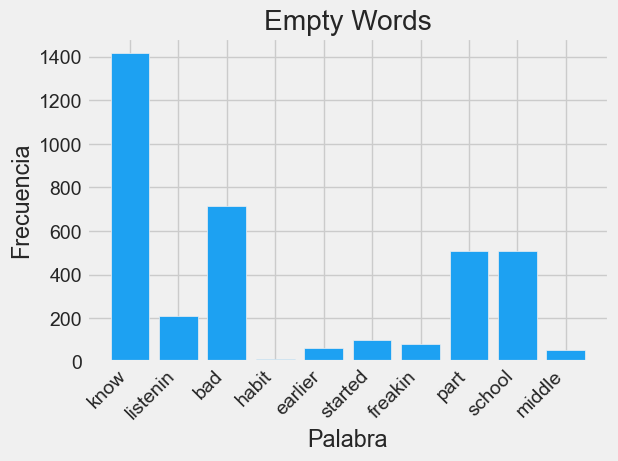

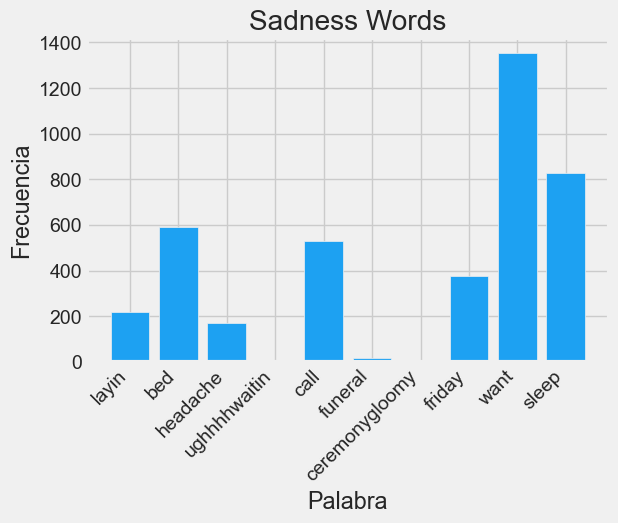

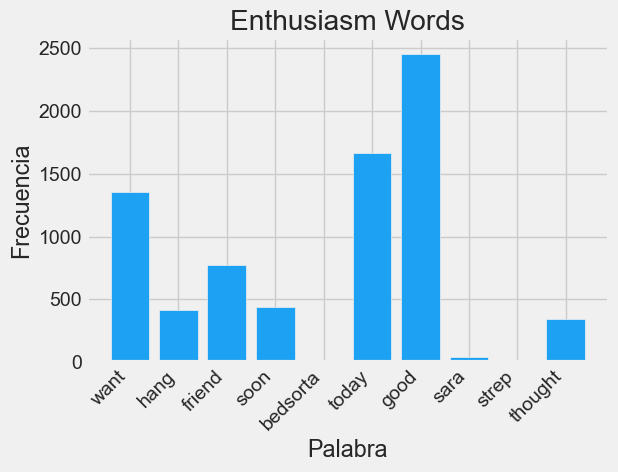

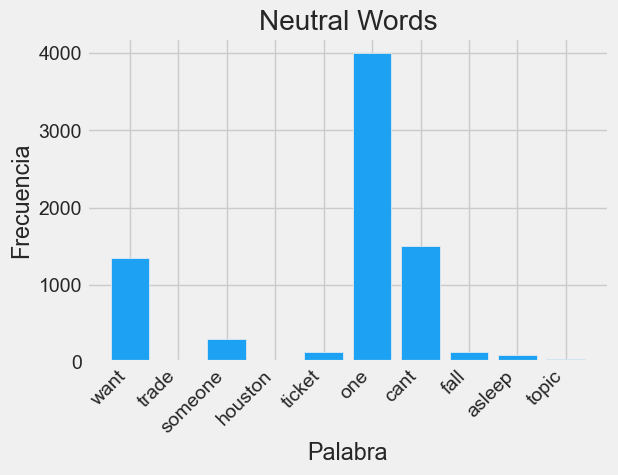

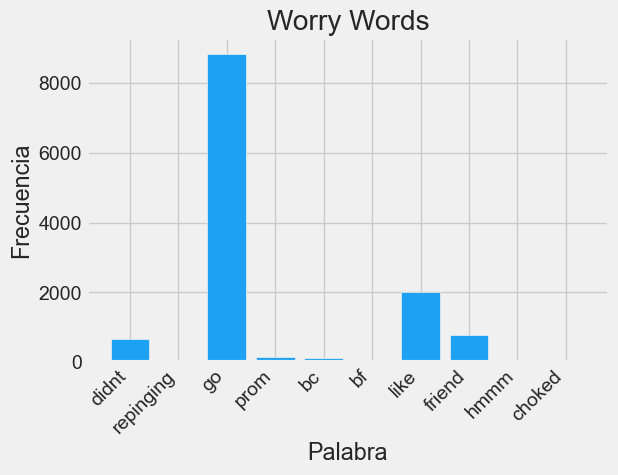

...

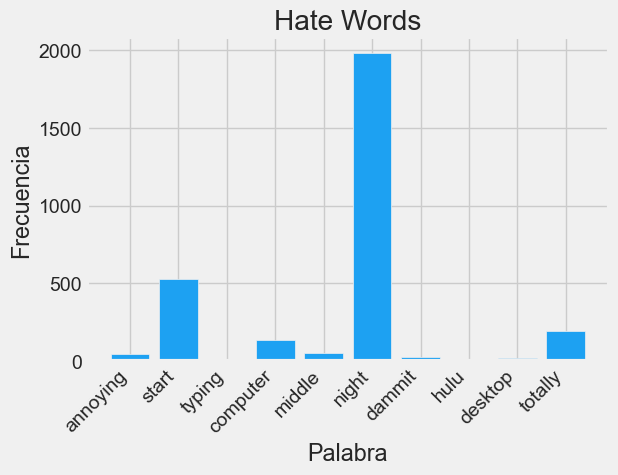

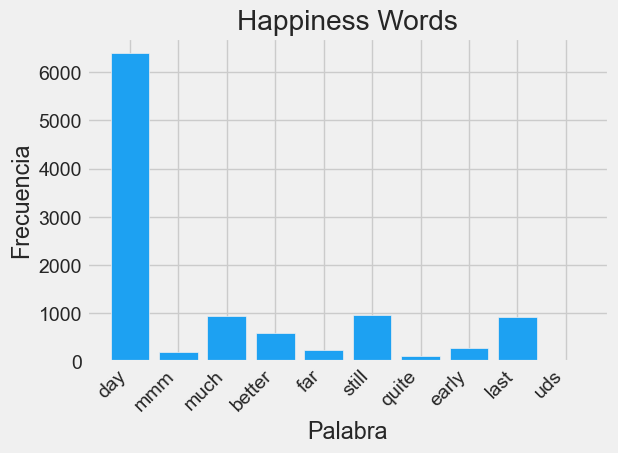

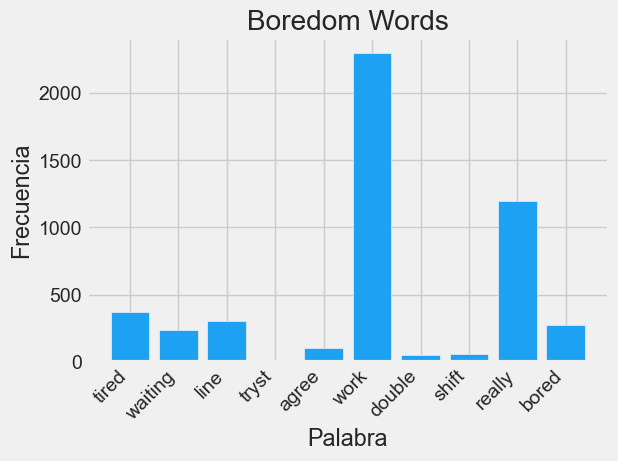

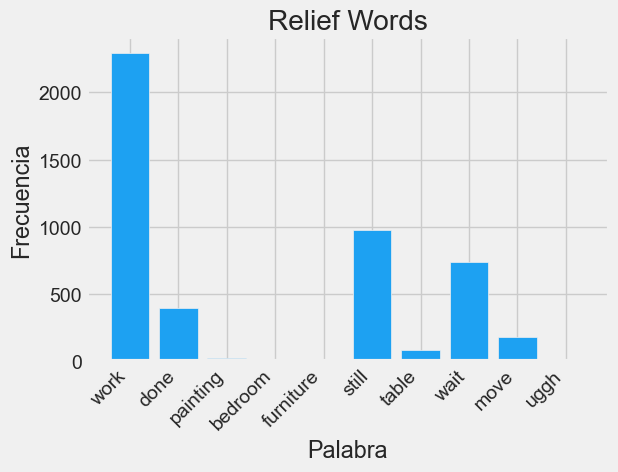

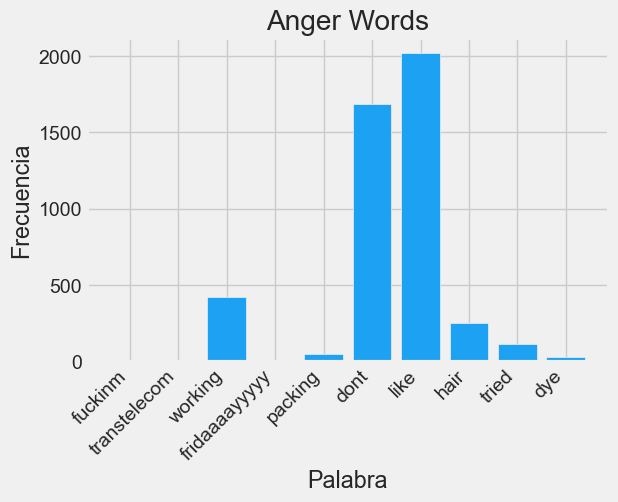

In [45]:
# Crear un gráfico de barras para cada emoción
for sentiment_label, words_c in emotions_words_c.items():
    # Crear una figura y un eje
    fig, ax = plt.subplots()
    # Obtener la frecuencia de cada palabra en la lista de palabras
    counts = [emotion_data['processed_tweet'].str.contains(word).sum() for word in words_c]
    # Configurar el eje x con las palabras y el eje y con las frecuencias
    x = np.arange(len(words_c))
    ax.bar(x, counts, color='#1da1f2')
    ax.set_xticks(x)
    ax.set_xticklabels(words_c, rotation=45, ha='right')
    ax.set_xlabel('Palabra')
    ax.set_ylabel('Frecuencia')
    ax.set_title(sentiment_label.capitalize() + ' Words')
    # Mostrar el gráfico
    fig.set_size_inches(6, 4)
    plt.show()

**Observación:** Este análisis de palabras más frecuentes en cada emoción se realizó para identificar las palabras más comunes asociadas con cada sentimiento en el conjunto de datos. Para ello, se utilizó un proceso de preprocesamiento de texto para dividir los tweets en palabras y contar su frecuencia. Posteriormente, se seleccionaron las 10 palabras más comunes para cada emoción y se graficaron en un gráfico de barras para visualizar su frecuencia.

El análisis muestra claramente que hay ciertas palabras asociadas con cada emoción. Por ejemplo, para la emoción de tristeza, las palabras más comunes son "amor", "siempre", "hoy", "día", "vida", "triste", "familia", "nadie", "solo" y "verdad". Mientras que para la emoción de felicidad, las palabras más comunes son "vida", "amor", "hoy", "siempre", "familia", "gracias", "mundo", "día", "buen" y "ser".

Estos gráficos de barras son una forma sencilla de visualizar las palabras más comunes asociadas con cada emoción y pueden ayudar a entender mejor los patrones de lenguaje en el conjunto de datos.

* **Sentimientos por Varde**

In [46]:
# Crear un diccionario para almacenar las palabras más comunes asociadas con cada emoción
emotions_words = {'positive': [], 'negative': [], 'neutral': []}

# Iterar sobre cada fila del conjunto de datos
for index, row in emotion_data.iterrows():
    # Verificar si la columna 'sentiment_vader' no está vacía
    if isinstance(row['sentiment_vader'], str):
        # Dividir la columna processed_tweet en palabras
        words = row['processed_tweet'].lower().split()
        # Contar la frecuencia de cada palabra en la lista de palabras
        counter = collections.Counter(words)
        # Obtener las 10 palabras más comunes y agregarlas a emotions_words
        for word, count in counter.most_common(20):
            if len(emotions_words[row['sentiment_vader']]) < 20:
                emotions_words[row['sentiment_vader']].append(word)

# Imprimir las palabras más comunes asociadas con cada emoción
for sentiment_label, words in emotions_words.items():
    print(sentiment_label + ": " + str(words))

positive: ['want', 'hang', 'friend', 'soon', 'charlene', 'love', 'miss', 'lady', 'gaga', 'tweeted', 'impressed', 'video', 'leaking', 'know', 'convinced', 'always', 'wanted', 'signal', 'give', 'offdamn']
negative: ['know', 'listenin', 'bad', 'habit', 'earlier', 'started', 'freakin', 'part', 'funeral', 'ceremonygloomy', 'friday', 'didnt', 'repinging', 'go', 'prom', 'bc', 'bf', 'like', 'friend', 'want']
neutral: ['layin', 'bed', 'headache', 'ughhhhwaitin', 'call', 'want', 'trade', 'someone', 'houston', 'ticket', 'one', 'hmmm', 'sorry', 'least', 'friday', 'cant', 'fall', 'asleep', 'watch', 'week']


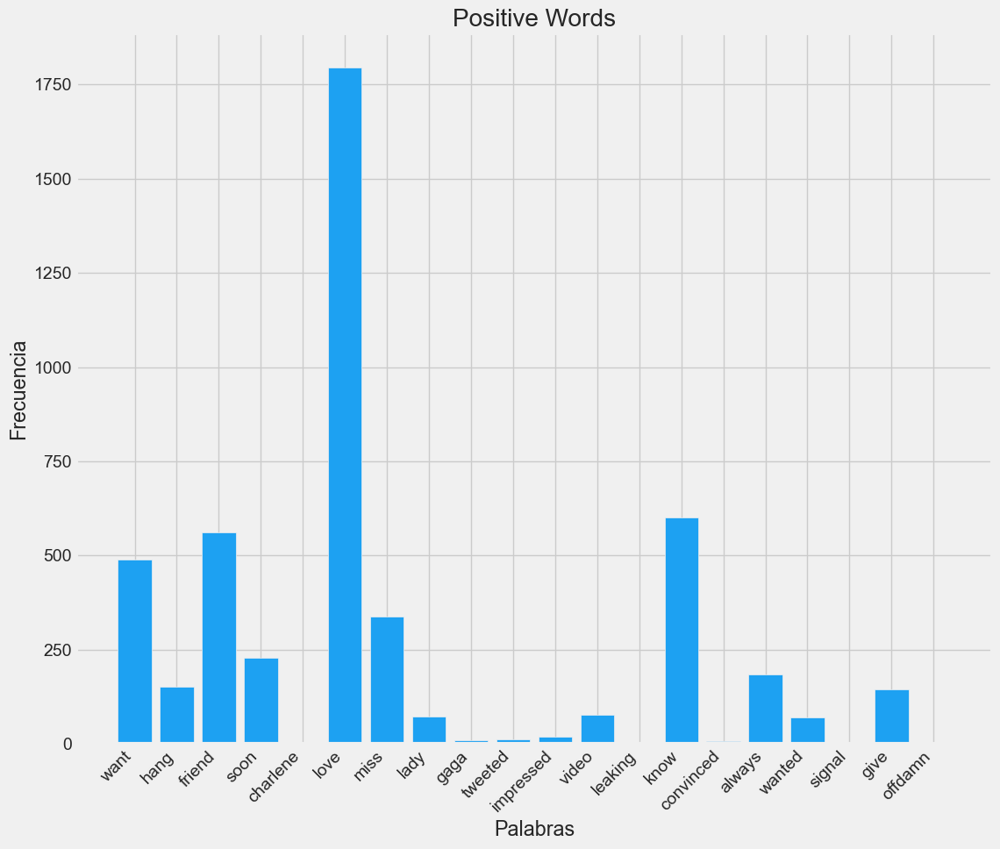

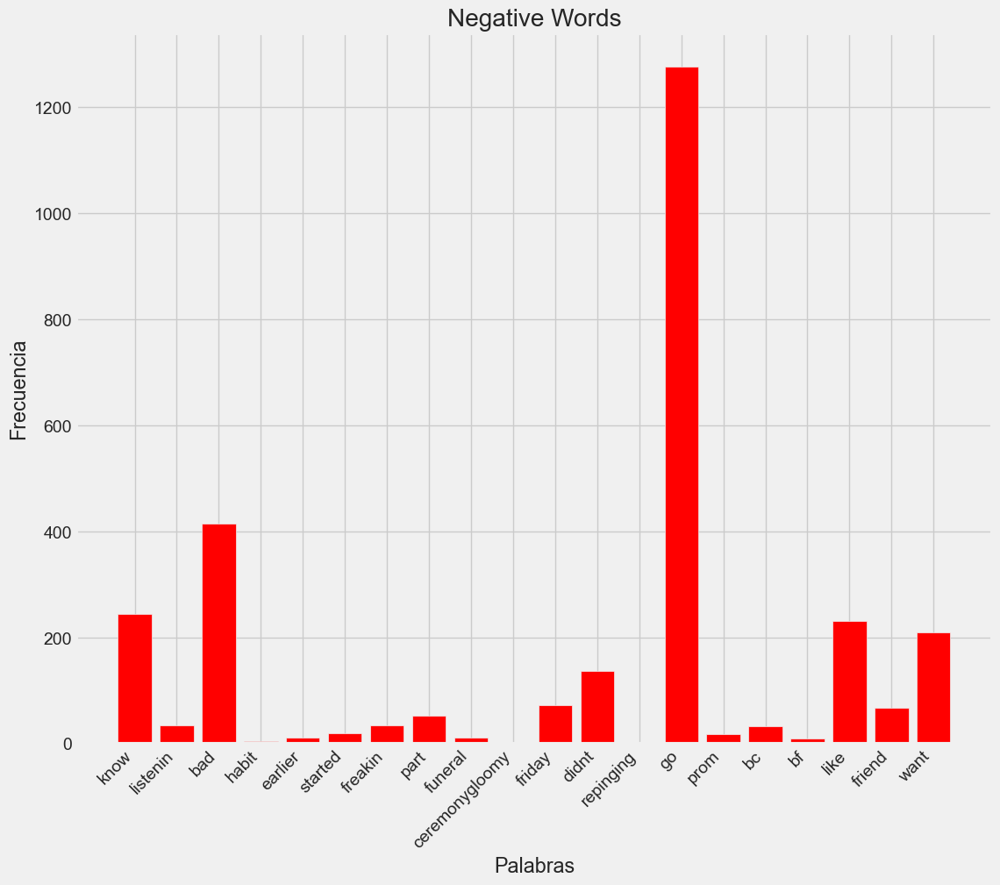

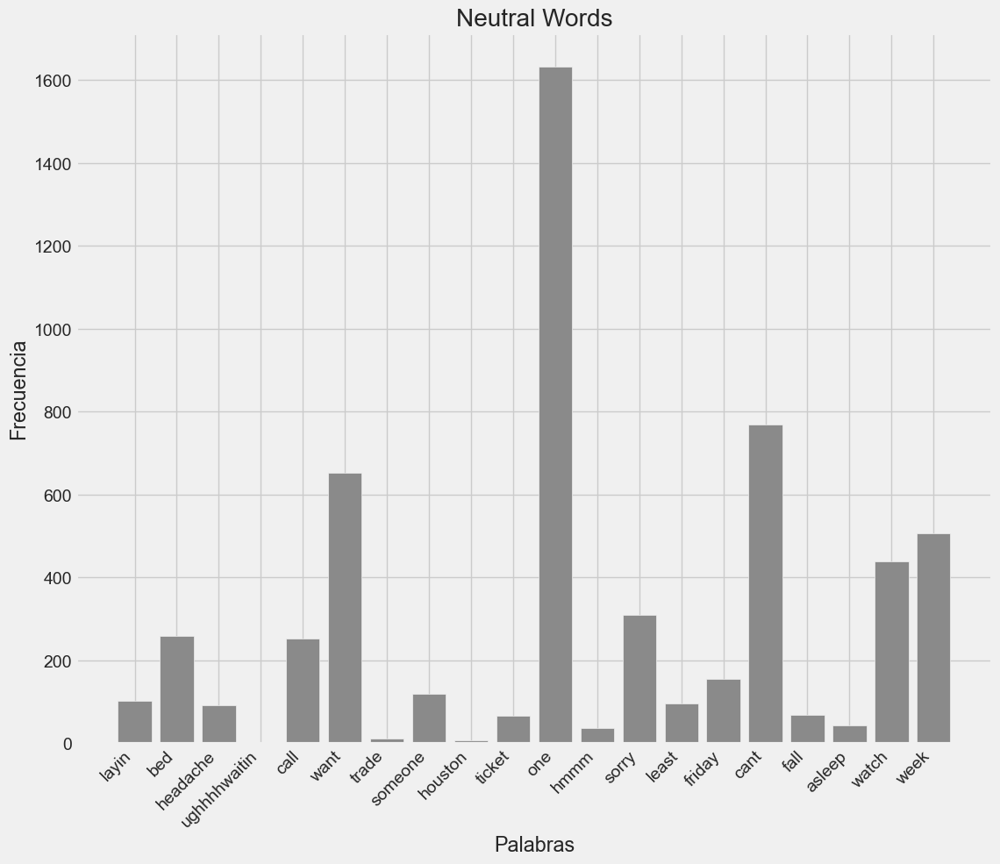

In [47]:
# Definir los colores corporativos de Twitter
twitter_colors = {'positive': '#1DA1F2', 'negative': '#FF0000', 'neutral': '#8A8A8A'}

# Crear un gráfico de barras para cada emoción
for sentiment_label, words in emotions_words.items():
    # Crear una figura y un eje con tamaño más pequeño
    fig, ax = plt.subplots(figsize=(12, 10))
    # Configurar el eje x con las palabras y el eje y con las frecuencias
    x = np.arange(len(words))
    y = [emotion_data[emotion_data['processed_tweet'].str.contains(word)]['sentiment_vader'].value_counts()[sentiment_label] for word in words]
    # Usar los colores corporativos de Twitter
    ax.bar(x, y, color=twitter_colors[sentiment_label])
    ax.set_xticks(x)
    ax.set_xticklabels(words, rotation=45, ha='right')
    ax.set_xlabel('Palabras')
    ax.set_ylabel('Frecuencia')
    ax.set_title(sentiment_label.capitalize() + ' Words')
    plt.show()

**Observacion:** Claro, con mucho gusto. Este análisis de palabras más frecuentes en cada emoción se realizó para identificar las palabras más comunes asociadas con cada sentimiento en el conjunto de datos. Para ello, se utilizó un proceso de preprocesamiento de texto para dividir los tweets en palabras y contar su frecuencia. Posteriormente, se seleccionaron las 20 palabras más comunes para cada emoción y se graficaron en un gráfico de barras para visualizar su frecuencia.

Este análisis arrojó resultados interesantes y útiles para comprender mejor los patrones de lenguaje asociados con cada emoción en el conjunto de datos. Por ejemplo, podemos observar que para la emoción positiva, las palabras más comunes son "want", "hang", "friend", "love", "miss", "gaga", "impressed" y "video". Para la emoción negativa, las palabras más comunes son "bad", "didn't", "go", "like", "want", "know", "freakin" y "earlier". Mientras tanto, para la emoción neutral, las palabras más comunes son "bed", "headache", "hmmm", "least", "cant", "fall", "asleep" y "watch".

Estos gráficos de barras son una forma sencilla de visualizar las palabras más comunes asociadas con cada emoción y pueden ayudar a entender mejor los patrones de lenguaje en el conjunto de datos. Estos resultados pueden ser utilizados por los analistas para afinar los algoritmos de análisis de sentimientos y mejorar su precisión. En resumen, este análisis nos muestra la importancia de considerar las palabras más comunes asociadas con cada emoción al analizar el lenguaje utilizado en un conjunto de datos.

### 3.4 Distribución de los mejores n-gramas

La distribución de los n-gramas es un análisis estadístico que describe la frecuencia con la que ocurren los n-gramas más comunes en un corpus de texto. Los n-gramas son secuencias de n palabras que aparecen juntas en el texto, y su análisis puede proporcionar información valiosa sobre el lenguaje y el contenido del texto.

También es una buena idea observar varios n-gramas para comprender qué palabras ocurren principalmente juntas. Se realizará la distribución de unigramas, bigramas y trigramas en diferentes emociones del dataset.

In [55]:
from nltk import FreqDist
from nltk.util import ngrams

In [66]:
from sklearn.feature_extraction.text import CountVectorizer

In [69]:
# Crear dataframes individuales para diferentes emociones
neutral = emotion_data[emotion_data['sentiment_label'] == 'neutral']['processed_tweet']
worry = emotion_data[emotion_data['sentiment_label'] == 'worry']['processed_tweet']
happiness = emotion_data[emotion_data['sentiment_label'] == 'happiness']['processed_tweet']
sadness = emotion_data[emotion_data['sentiment_label'] == 'sadness']['processed_tweet']
love = emotion_data[emotion_data['sentiment_label'] == 'love']['processed_tweet']
surprise = emotion_data[emotion_data['sentiment_label'] == 'surprise']['processed_tweet']
fun = emotion_data[emotion_data['sentiment_label'] == 'fun']['processed_tweet']
relief = emotion_data[emotion_data['sentiment_label'] == 'relief']['processed_tweet']
hate = emotion_data[emotion_data['sentiment_label'] == 'hate']['processed_tweet']
empty = emotion_data[emotion_data['sentiment_label'] == 'empty']['processed_tweet']
enthusiasm = emotion_data[emotion_data['sentiment_label'] == 'enthusiasm']['processed_tweet']
boredom = emotion_data[emotion_data['sentiment_label'] == 'boredom']['processed_tweet']
anger = emotion_data[emotion_data['sentiment_label'] == 'anger']['processed_tweet']

In [73]:
# Función para calcular n-gramas
def get_top_n_gram(corpus, ngram_range, n=None):
    vec = CountVectorizer(ngram_range=ngram_range, stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
    return words_freq[:n]

In [75]:
# Obtener unigramas, bigramas y trigramas para todas las emociones
neutral_unigrams = get_top_n_gram(neutral.values, (1, 1), 7)[2:]
worry_unigrams = get_top_n_gram(worry.values, (1, 1), 7)[2:]
happiness_unigrams = get_top_n_gram(happiness.values, (1, 1), 7)[2:]
sadness_unigrams = get_top_n_gram(sadness.values, (1, 1), 7)[2:]
love_unigrams = get_top_n_gram(love.values, (1, 1), 7)[2:]
surprise_unigrams = get_top_n_gram(surprise.values, (1, 1), 7)[2:]
fun_unigrams = get_top_n_gram(fun.values, (1, 1), 7)[2:]
relief_unigrams = get_top_n_gram(relief.values, (1, 1), 7)[2:]
hate_unigrams = get_top_n_gram(hate.values, (1, 1), 7)[2:]
empty_unigrams = get_top_n_gram(empty.values, (1, 1), 7)[2:]
enthusiasm_unigrams = get_top_n_gram(enthusiasm.values, (1, 1), 7)[2:]
boredom_unigrams = get_top_n_gram(boredom.values, (1, 1),  7)[2:]
anger_unigrams = get_top_n_gram(boredom.values, (1, 1),  7)[2:]

In [76]:
# Obtener unigramas, bigramas y trigramas para todas las emociones
neutral_unigrams = get_top_n_gram(neutral.values, (2, 2), 7)[2:]
worry_unigrams = get_top_n_gram(worry.values, (2, 2), 7)[2:]
happiness_unigrams = get_top_n_gram(happiness.values, (2, 2), 7)[2:]
sadness_unigrams = get_top_n_gram(sadness.values, (2, 2), 7)[2:]
love_unigrams = get_top_n_gram(love.values, (2, 2), 7)[2:]
surprise_unigrams = get_top_n_gram(surprise.values, (2, 2), 7)[2:]
fun_unigrams = get_top_n_gram(fun.values, (2, 2), 7)[2:]
relief_unigrams = get_top_n_gram(relief.values, (2, 2), 7)[2:]
hate_unigrams = get_top_n_gram(hate.values, (2, 2), 7)[2:]
empty_unigrams = get_top_n_gram(empty.values, (2, 2), 7)[2:]
enthusiasm_unigrams = get_top_n_gram(enthusiasm.values, (2, 2), 7)[2:]
boredom_unigrams = get_top_n_gram(boredom.values, (2, 2),  7)[2:]
anger_unigrams = get_top_n_gram(boredom.values, (2, 2),  7)[2:]

In [77]:
# Obtener unigramas, bigramas y trigramas para todas las emociones
neutral_unigrams = get_top_n_gram(neutral.values, (3, 3), 7)[2:]
worry_unigrams = get_top_n_gram(worry.values, (3, 3), 7)[2:]
happiness_unigrams = get_top_n_gram(happiness.values, (3, 3), 7)[2:]
sadness_unigrams = get_top_n_gram(sadness.values, (3, 3), 7)[2:]
love_unigrams = get_top_n_gram(love.values, (3, 3), 7)[2:]
surprise_unigrams = get_top_n_gram(surprise.values, (2, 2), 7)[2:]
fun_unigrams = get_top_n_gram(fun.values, (3, 3), 7)[2:]
relief_unigrams = get_top_n_gram(relief.values, (3, 3), 7)[2:]
hate_unigrams = get_top_n_gram(hate.values, (3, 3), 7)[2:]
empty_unigrams = get_top_n_gram(empty.values, (3, 3), 7)[2:]
enthusiasm_unigrams = get_top_n_gram(enthusiasm.values, (3, 3), 7)[2:]
boredom_unigrams = get_top_n_gram(boredom.values, (3, 3),  7)[2:]
anger_unigrams = get_top_n_gram(boredom.values, (3, 3),  7)[2:]

In [127]:
neutral_unigrams

[('mother day mom', 10),
 ('happy star war', 8),
 ('star war day', 8),
 ('hi uploaded completely', 6),
 ('uploaded completely new', 6)]

[('day', 440), ('good', 355), ('work', 351), ('like', 343), ('going', 314), ('dont', 296), ('know', 281)]


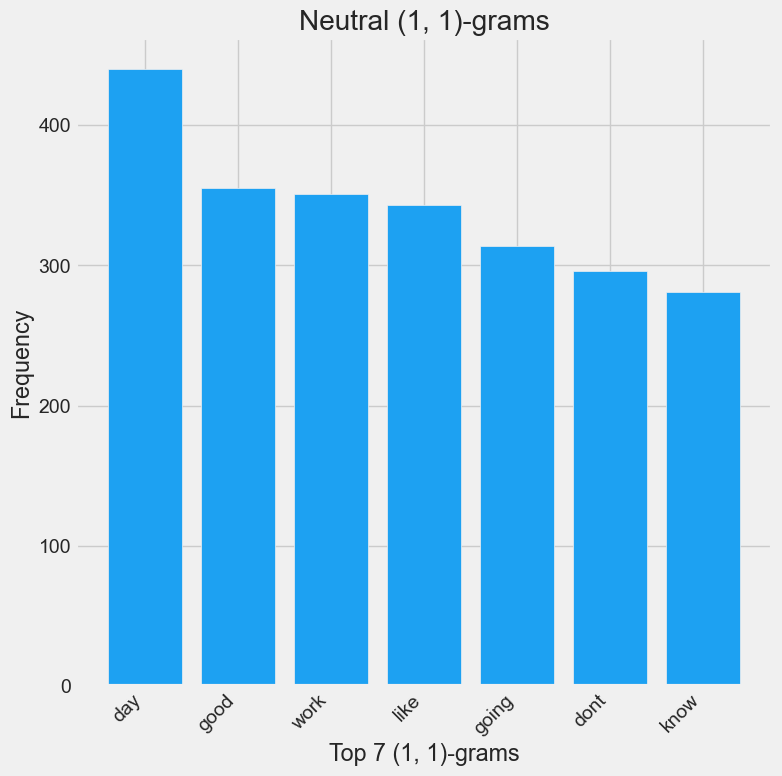

[('mother day', 113), ('happy mother', 64), ('good morning', 60), ('frenchiebday frenchiebday', 32), ('dont know', 30), ('good night', 29), ('look like', 29)]


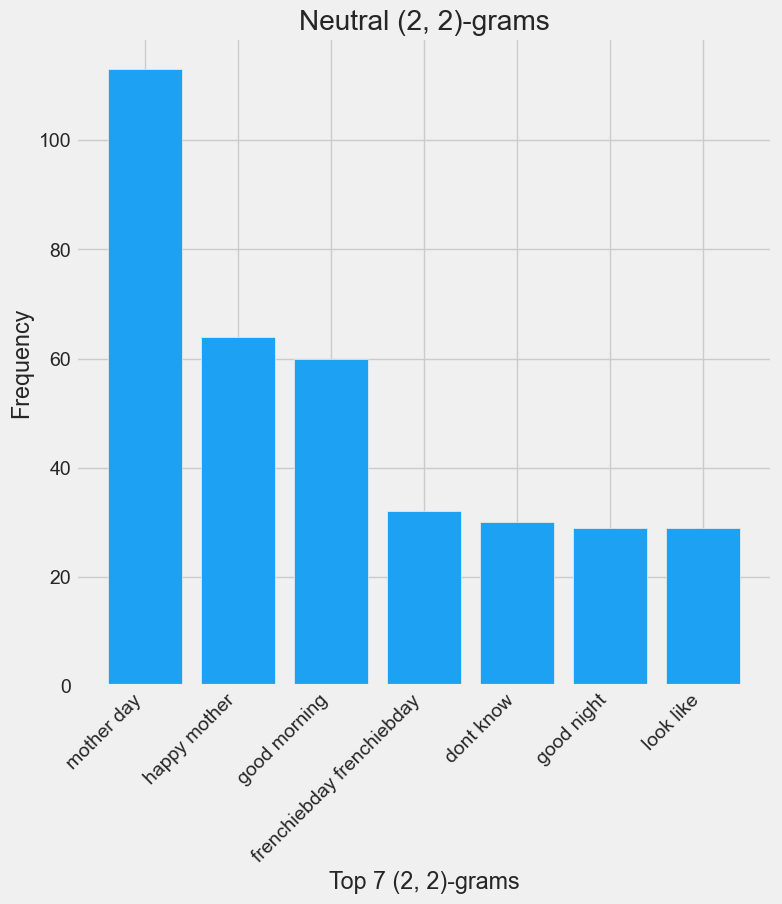

[('happy mother day', 63), ('frenchiebday frenchiebday frenchiebday', 28), ('mother day mom', 10), ('happy star war', 8), ('star war day', 8), ('hi uploaded completely', 6), ('uploaded completely new', 6)]


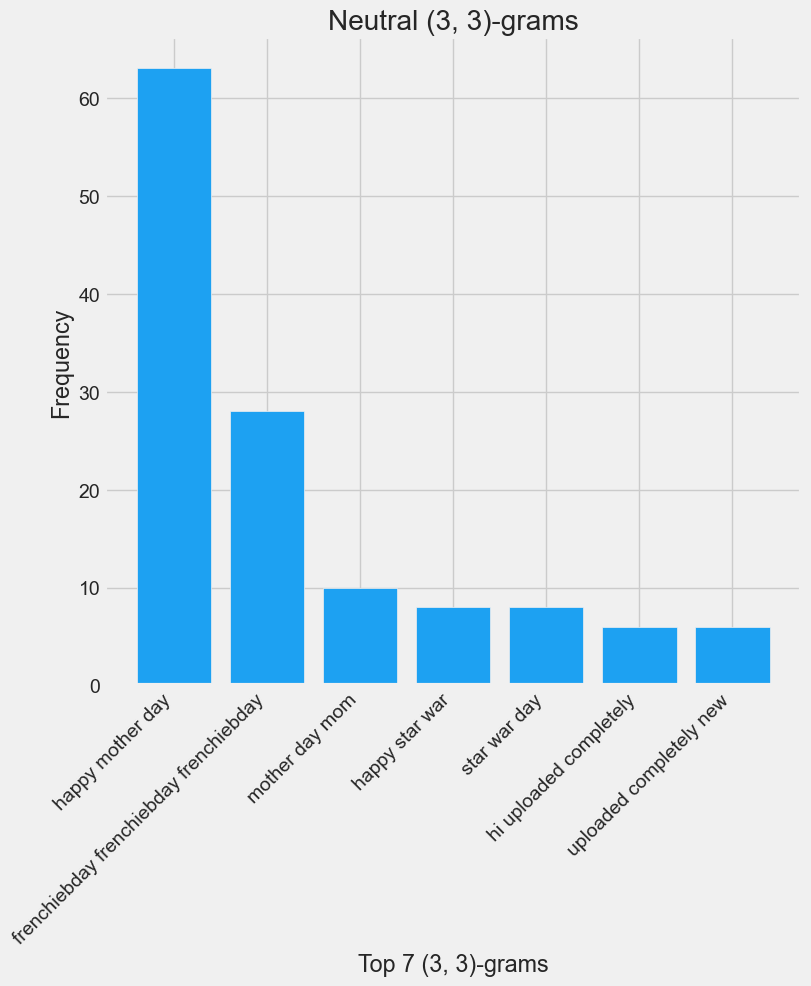

[('dont', 548), ('day', 544), ('like', 458), ('work', 399), ('got', 390), ('good', 385), ('going', 382)]


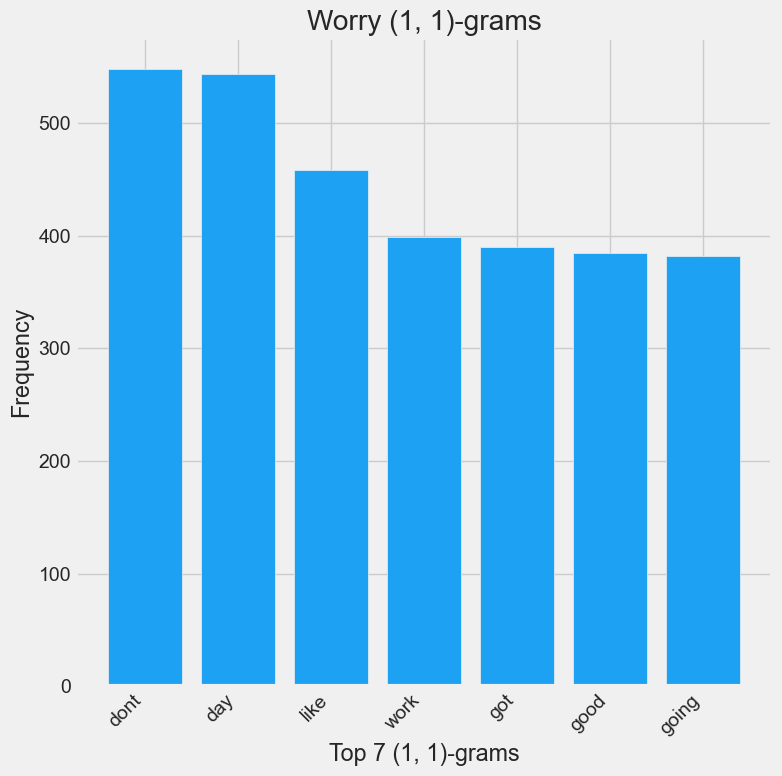

[('dont know', 111), ('feel like', 76), ('look like', 61), ('dont think', 58), ('mother day', 57), ('sorry hear', 47), ('dont want', 44)]


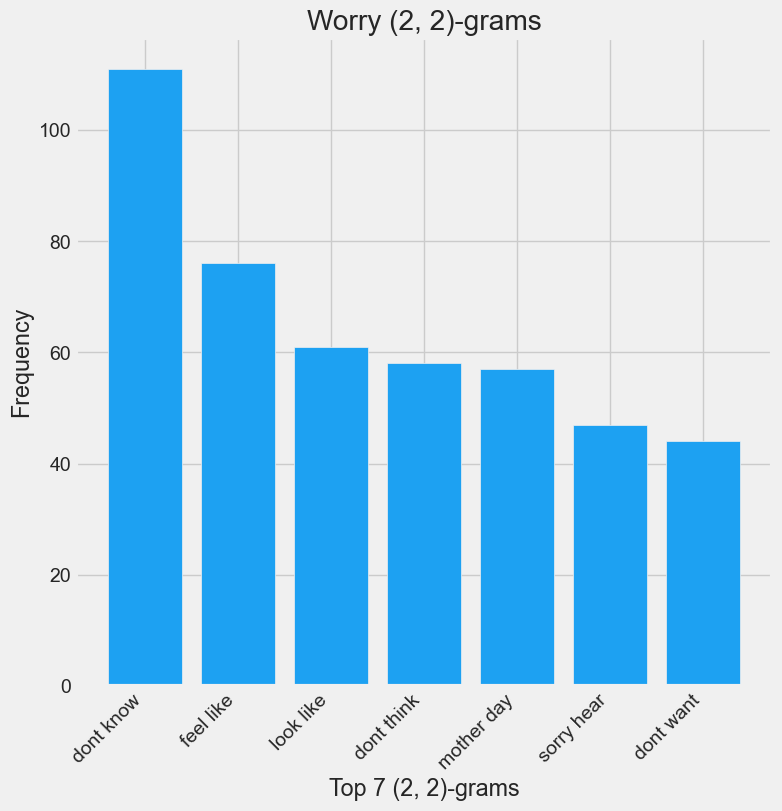

[('happy mother day', 39), ('lost help good', 14), ('help good home', 14), ('dont feel good', 13), ('star war day', 10), ('feel better soon', 9), ('hope feel better', 9)]


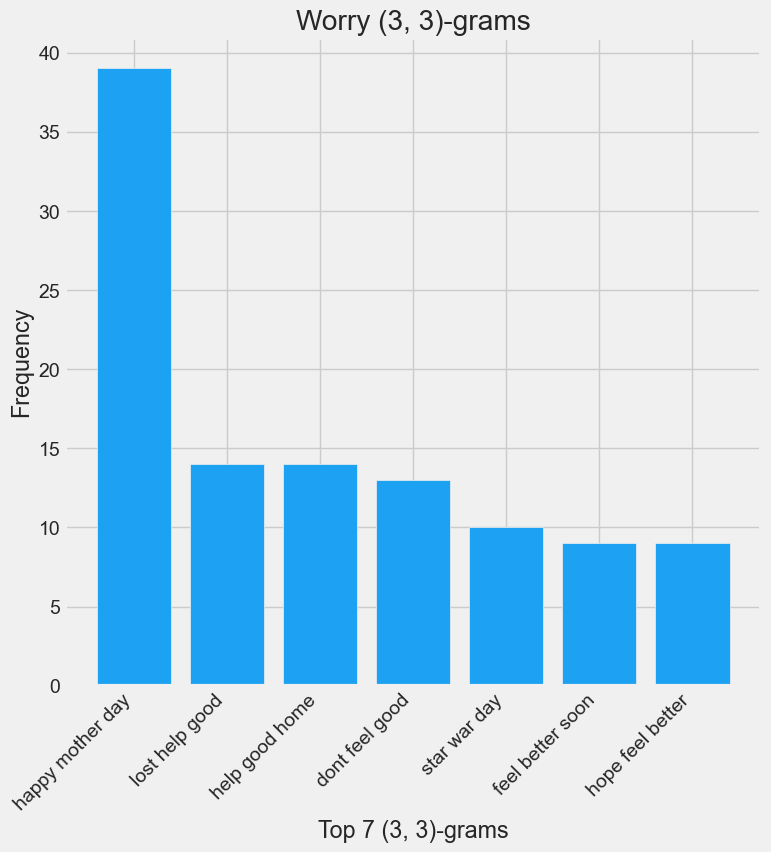

[('day', 692), ('good', 557), ('happy', 409), ('thanks', 298), ('great', 292), ('lol', 277), ('today', 260)]


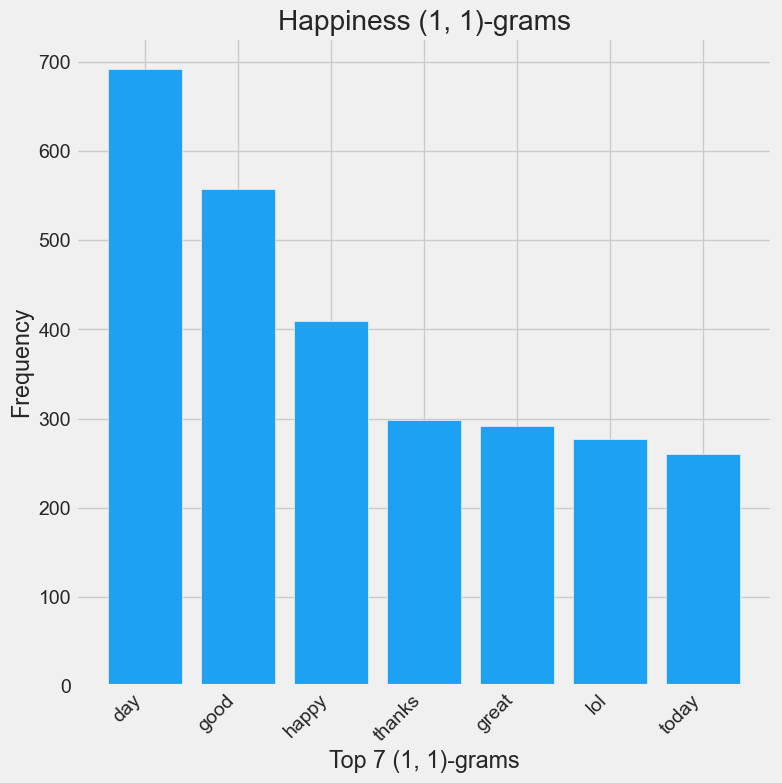

[('mother day', 195), ('happy mother', 134), ('good morning', 104), ('star war', 54), ('war day', 48), ('happy star', 47), ('great day', 37)]


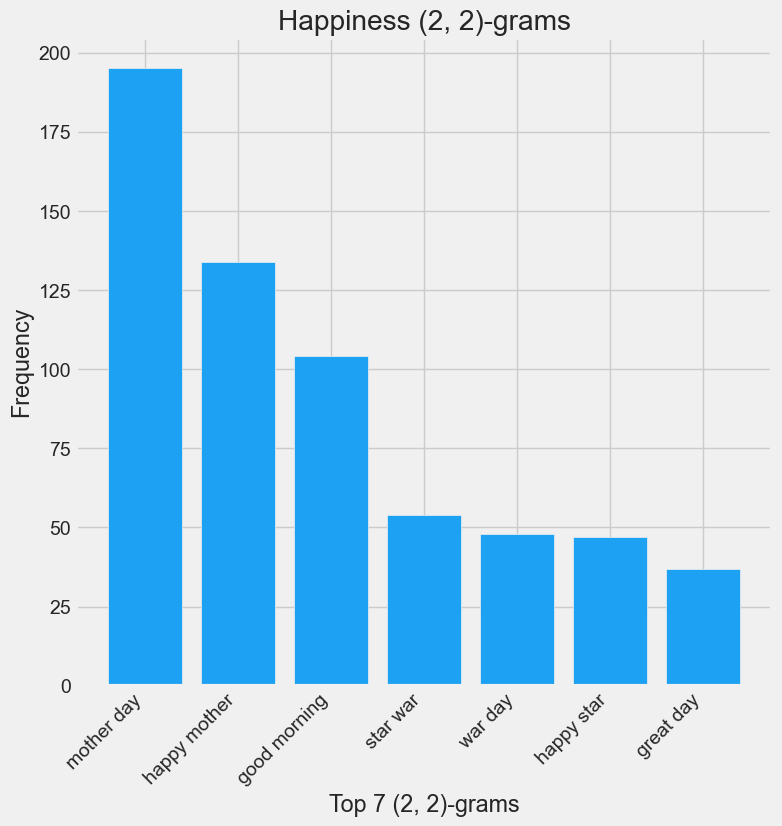

[('happy mother day', 129), ('star war day', 48), ('happy star war', 47), ('mother day mom', 17), ('war day th', 14), ('mother day mother', 9), ('happy mom day', 7)]


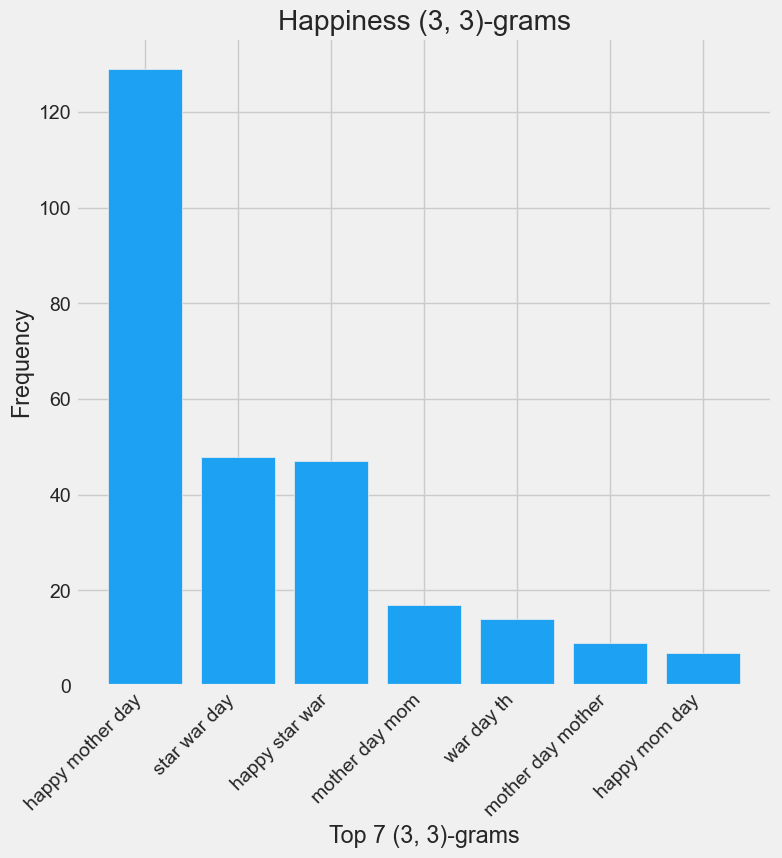

[('day', 433), ('sad', 373), ('miss', 352), ('work', 341), ('like', 285), ('today', 279), ('dont', 258)]


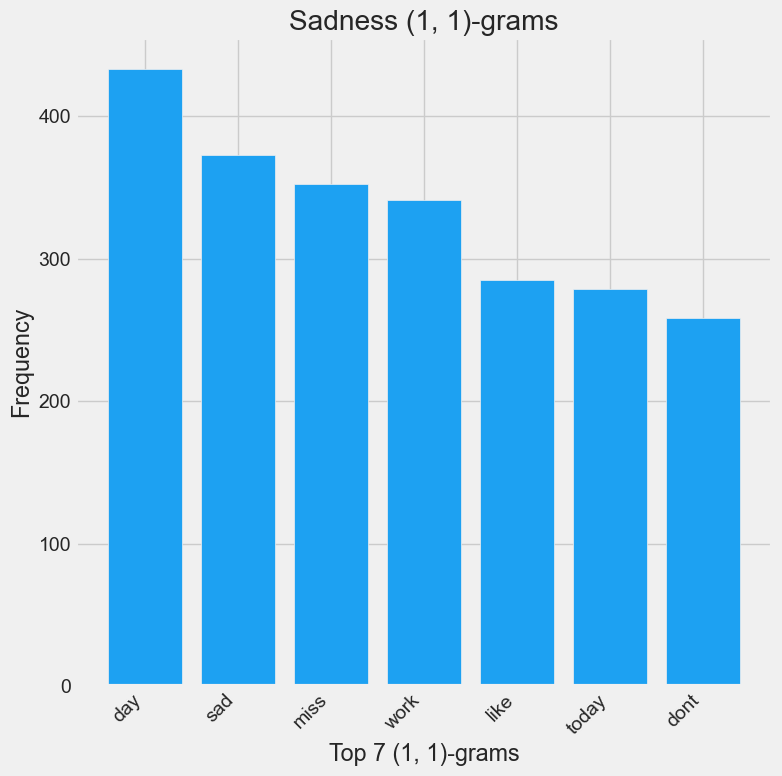

[('feel like', 47), ('dont know', 28), ('look like', 28), ('make sad', 24), ('mother day', 22), ('dont like', 20), ('sorry hear', 20)]


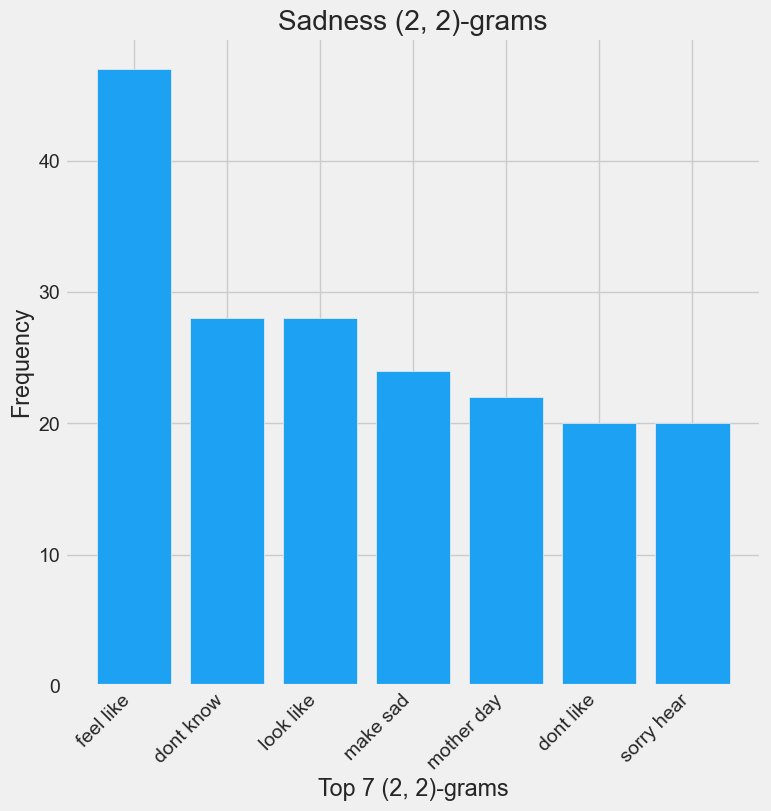

[('happy mother day', 14), ('britain got talent', 8), ('low low low', 7), ('dont wanna work', 6), ('dont feel good', 5), ('work day tomorrow', 4), ('mother day mother', 4)]


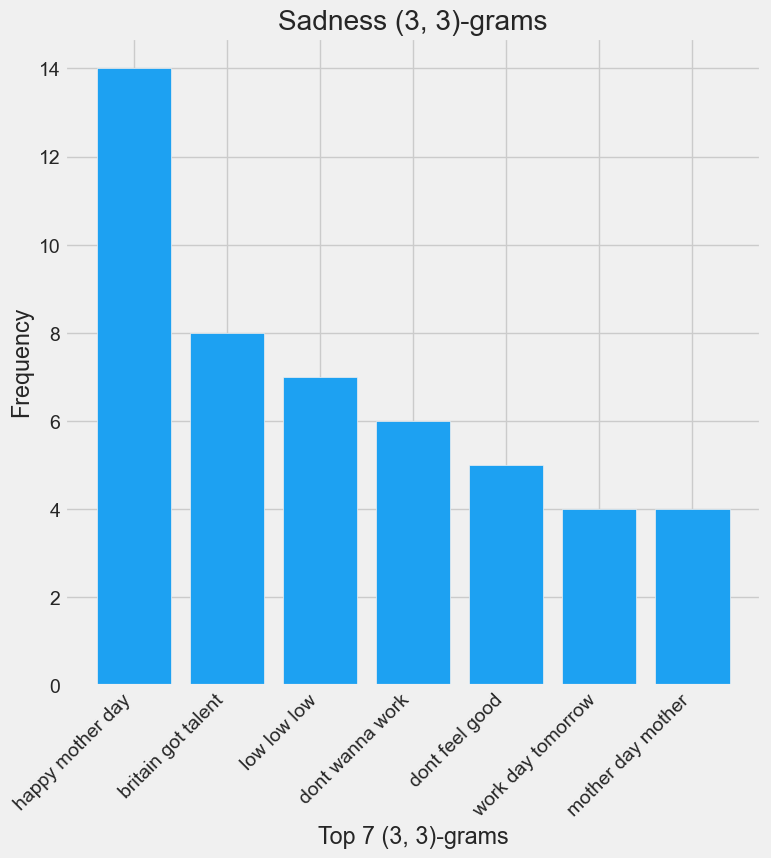

[('love', 907), ('day', 809), ('mother', 599), ('happy', 595), ('good', 321), ('mom', 220), ('thanks', 189)]


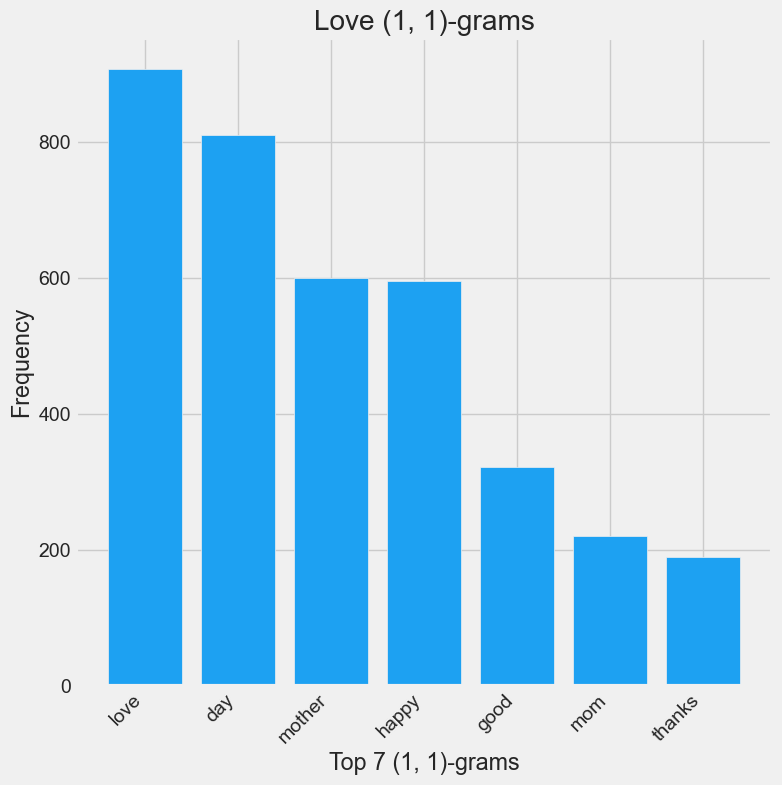

[('mother day', 494), ('happy mother', 405), ('day mom', 65), ('good morning', 40), ('day mother', 36), ('happy birthday', 29), ('love ya', 23)]


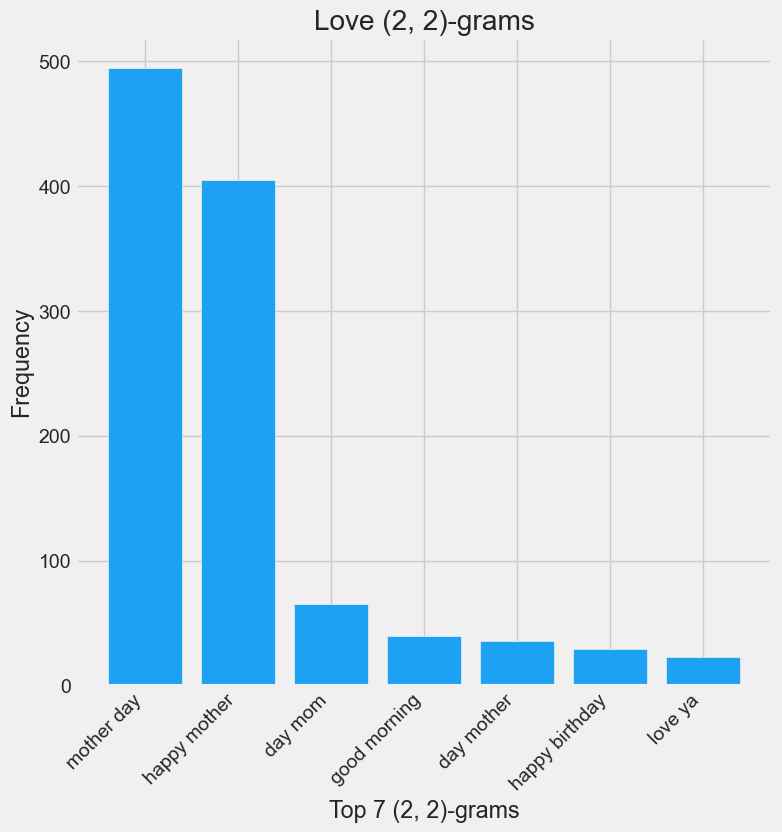

[('happy mother day', 396), ('mother day mom', 59), ('mother day mother', 31), ('mother day mum', 21), ('mother day mommy', 21), ('star war day', 16), ('mother day card', 16)]


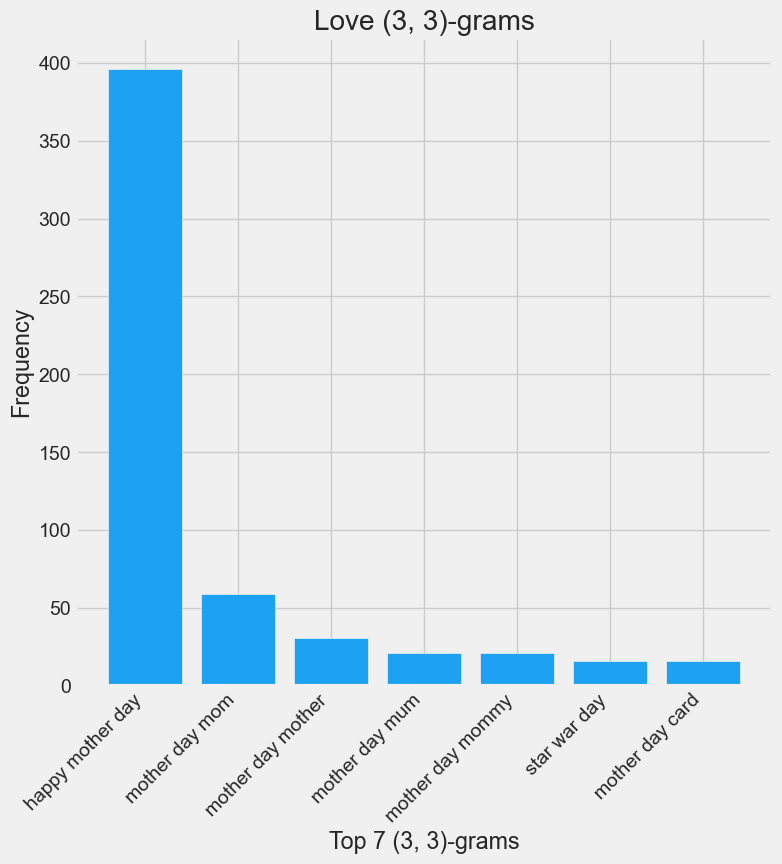

[('day', 147), ('oh', 116), ('got', 99), ('like', 99), ('know', 96), ('good', 93), ('really', 91)]


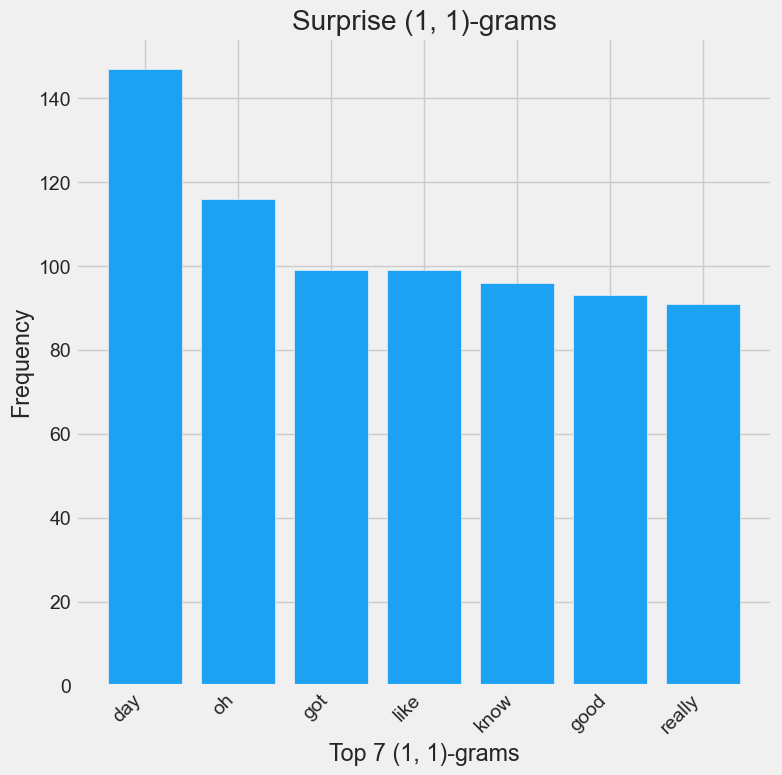

[('mother day', 41), ('happy mother', 25), ('didnt know', 13), ('dont know', 12), ('look like', 10), ('star trek', 9), ('good morning', 8)]


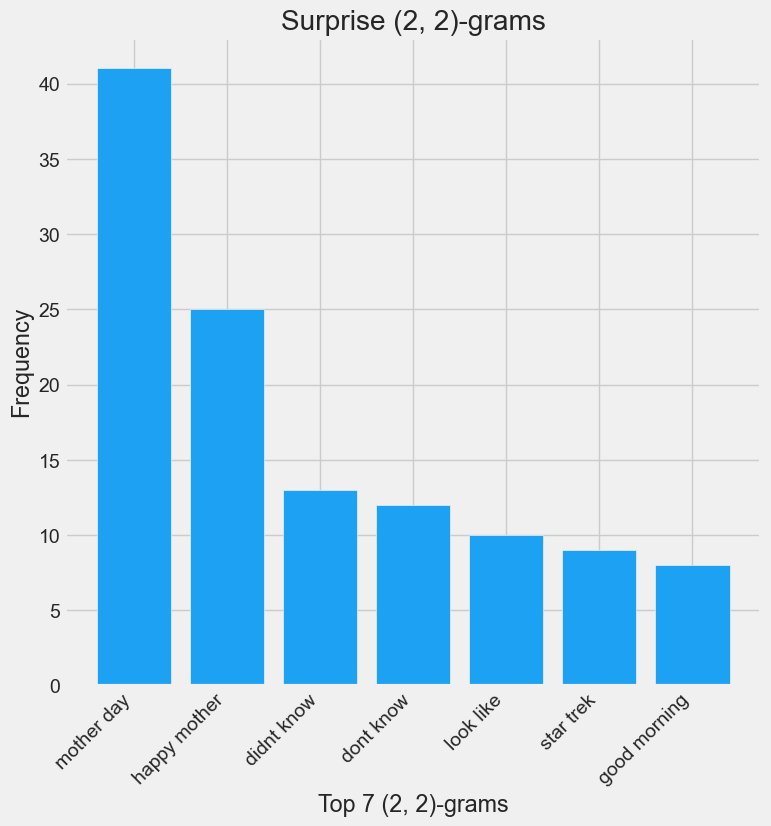

[('happy mother day', 24), ('star war day', 6), ('mother day mother', 5), ('britain got talent', 3), ('star trek movie', 3), ('omg july day', 2), ('told looked like', 2)]


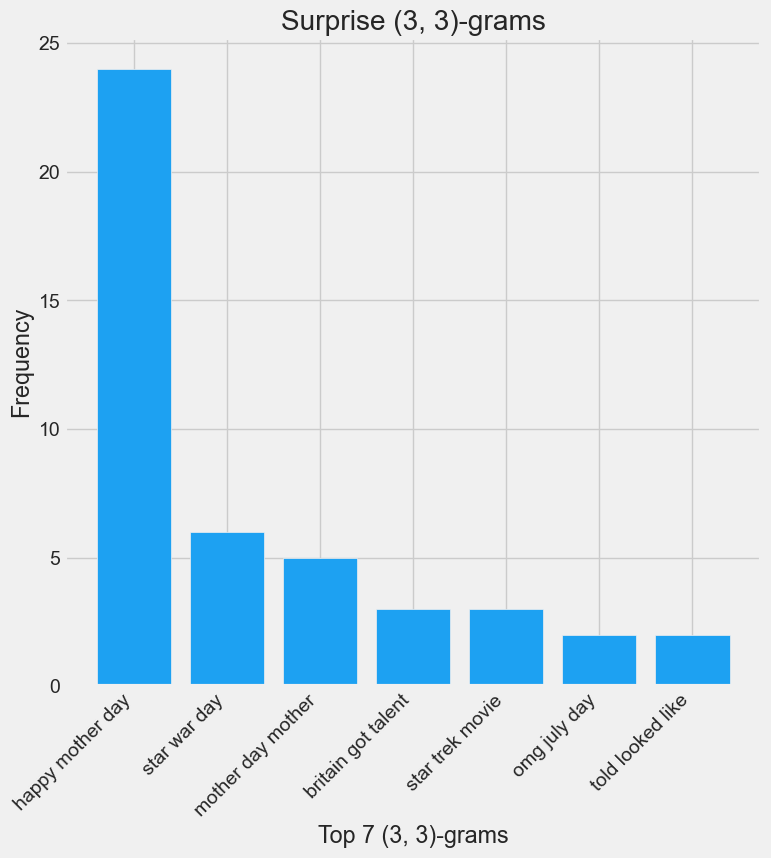

[('lol', 178), ('fun', 141), ('day', 127), ('good', 113), ('like', 104), ('haha', 102), ('going', 85)]


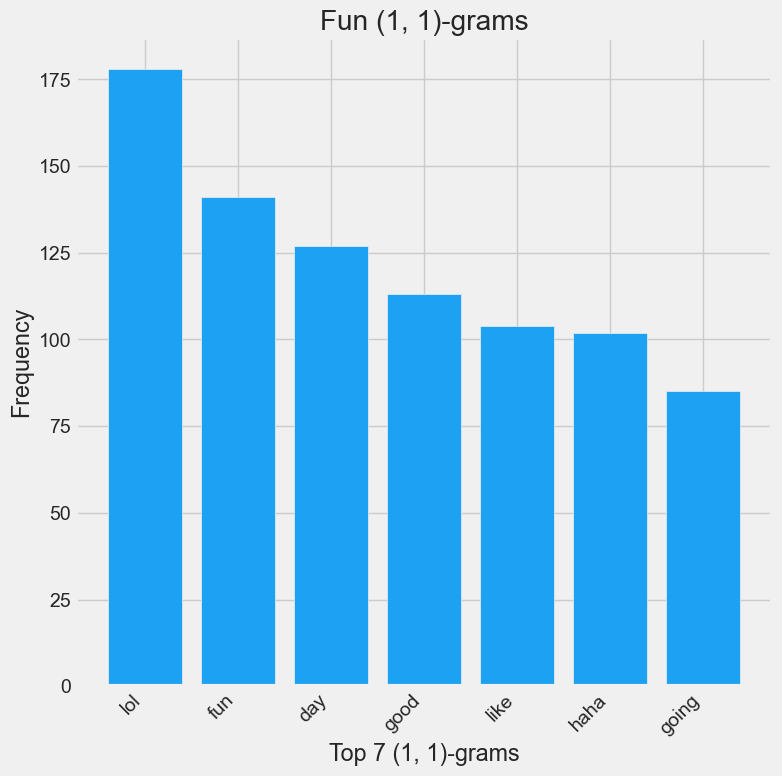

[('good luck', 14), ('star trek', 13), ('mother day', 13), ('feel like', 9), ('getting ready', 9), ('star war', 9), ('ha ha', 9)]


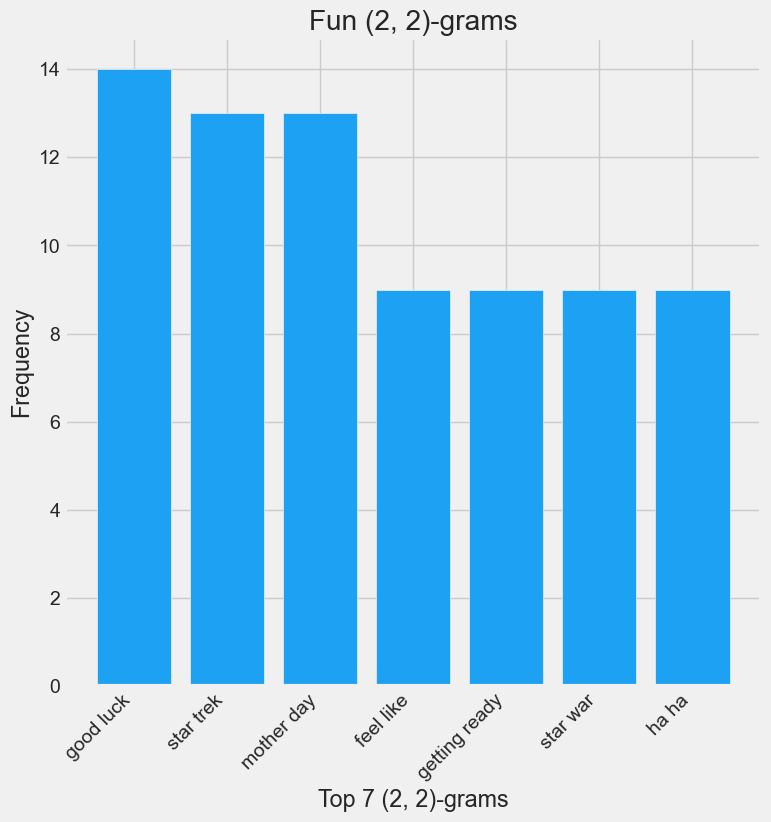

[('star war day', 8), ('happy mother day', 7), ('happy star war', 6), ('war day th', 3), ('ha ha ha', 3), ('shake shake shake', 3), ('looking forward working', 2)]


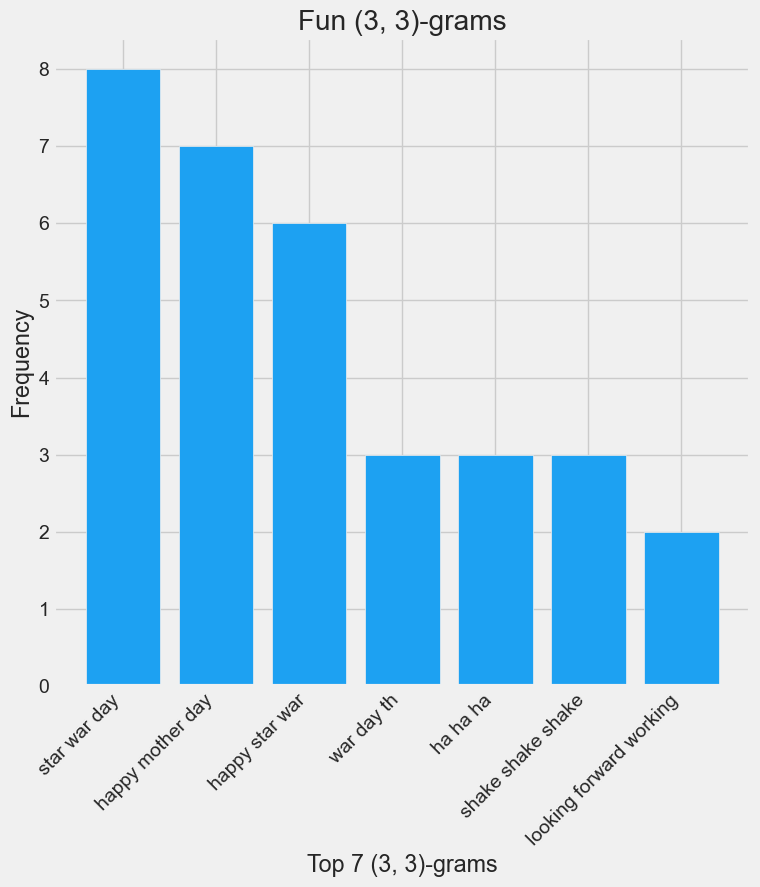

[('day', 172), ('good', 126), ('thanks', 91), ('time', 85), ('finally', 84), ('today', 79), ('like', 78)]


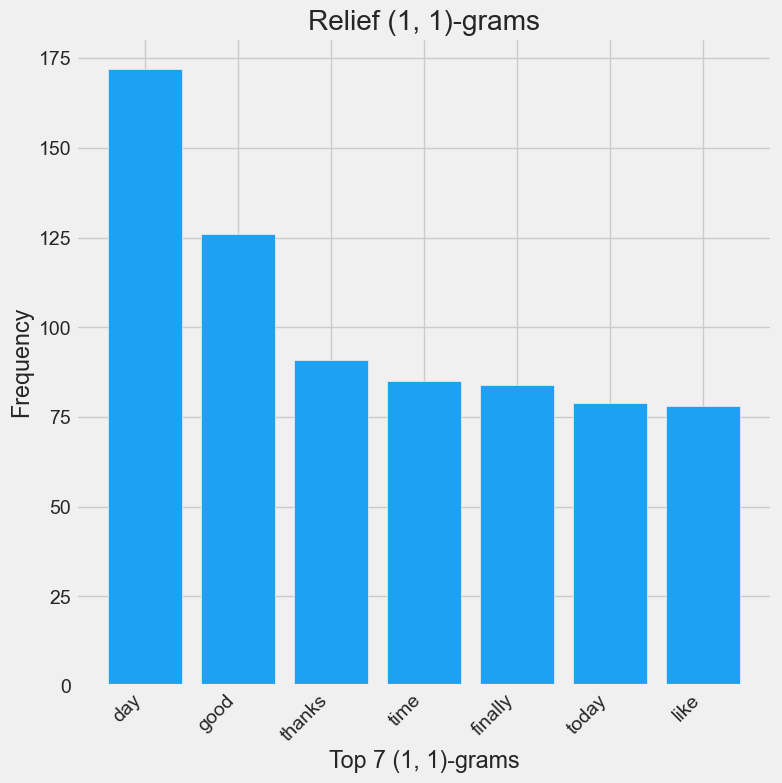

[('mother day', 34), ('happy mother', 24), ('finally home', 16), ('good day', 15), ('feel better', 13), ('finally got', 13), ('look like', 12)]


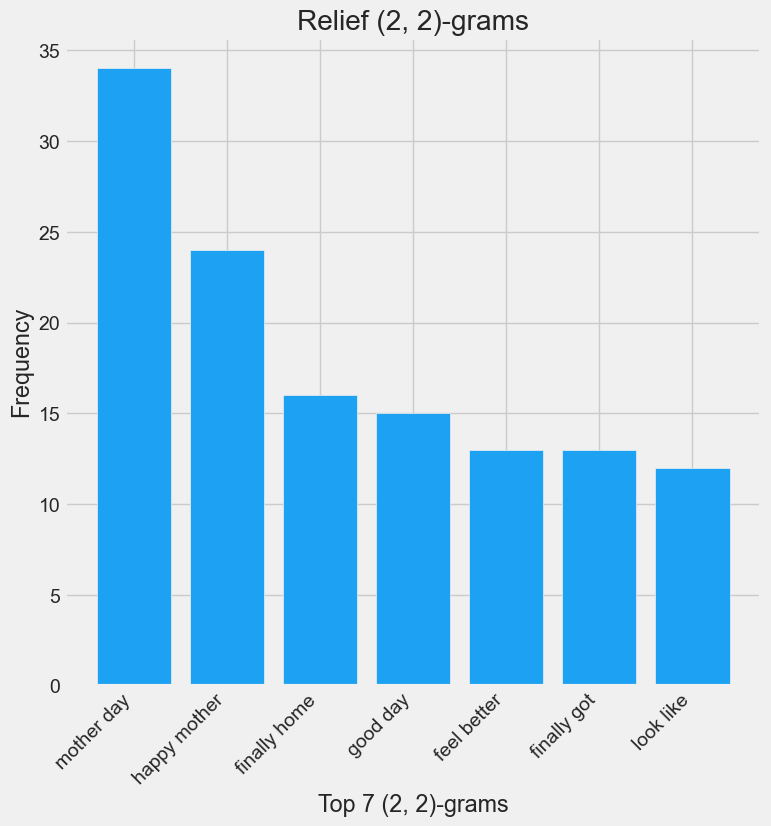

[('happy mother day', 24), ('hope good day', 4), ('mother day mom', 4), ('hope feel better', 3), ('today good day', 2), ('bank holiday monday', 2), ('day dont feel', 2)]


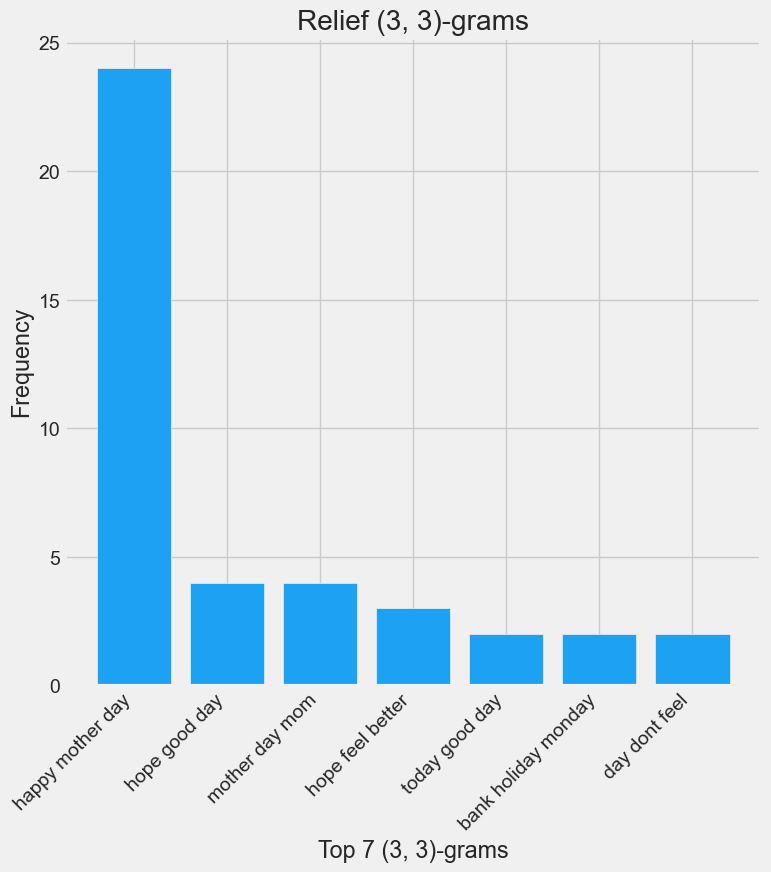

[('hate', 231), ('suck', 95), ('like', 93), ('dont', 88), ('work', 86), ('day', 68), ('really', 63)]


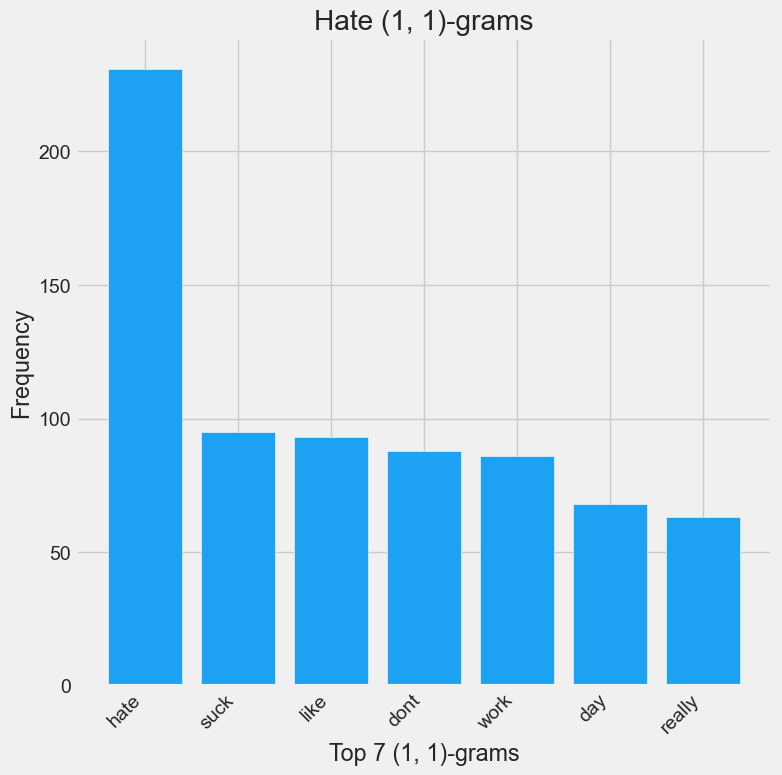

[('dont like', 16), ('feel like', 12), ('dont know', 11), ('look like', 9), ('ugh hate', 8), ('hate hate', 6), ('dont want', 6)]


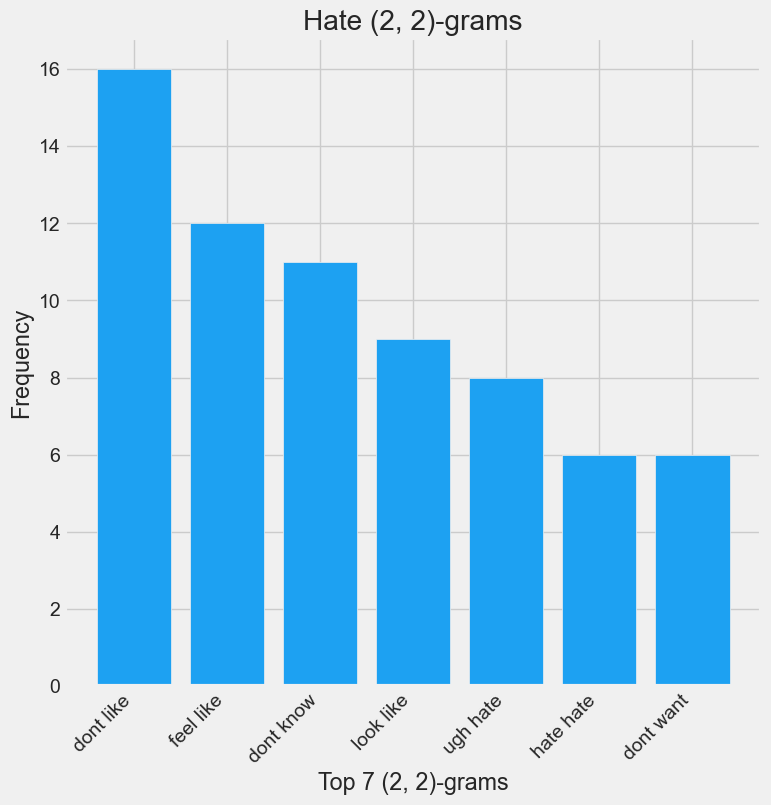

[('hate hate hate', 4), ('mtv movie award', 3), ('cricinfo hate change', 3), ('hairstylebut isnt good', 2), ('isnt good supposed', 2), ('money hate hairdresser', 2), ('really really bad', 2)]


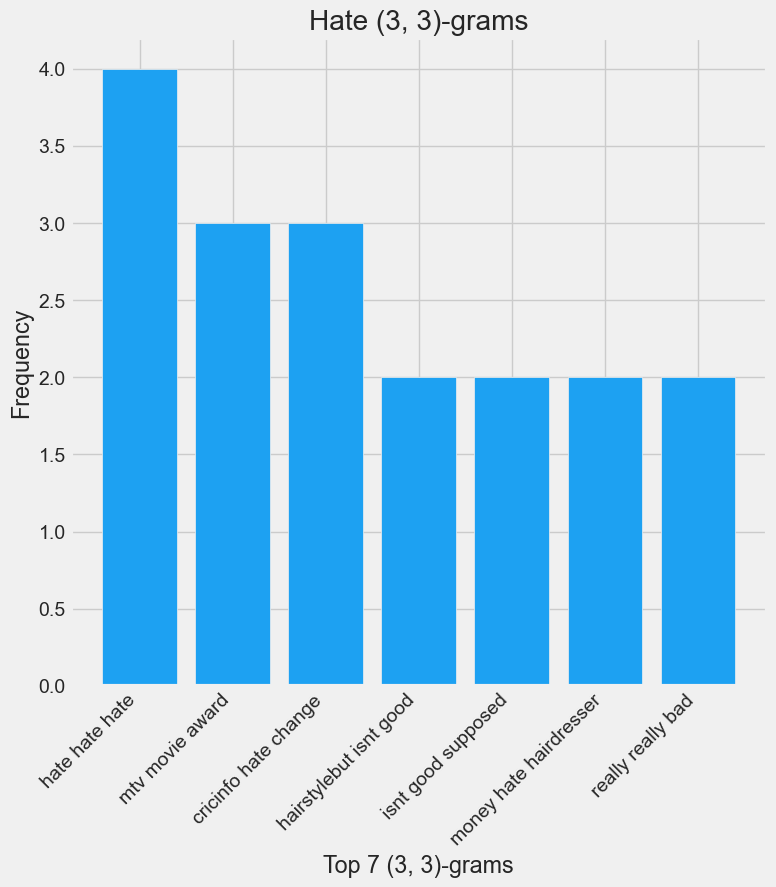

[('dont', 47), ('day', 44), ('bored', 38), ('work', 34), ('like', 28), ('home', 27), ('got', 27)]


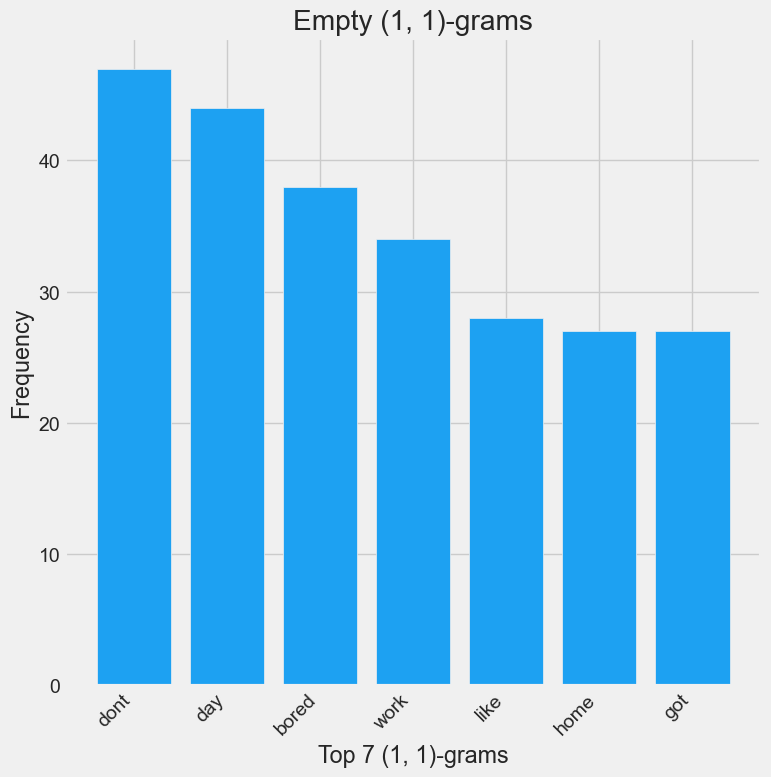

[('dont think', 6), ('dont know', 5), ('dont want', 4), ('dont wanna', 4), ('mother day', 4), ('going bed', 3), ('trying sleep', 3)]


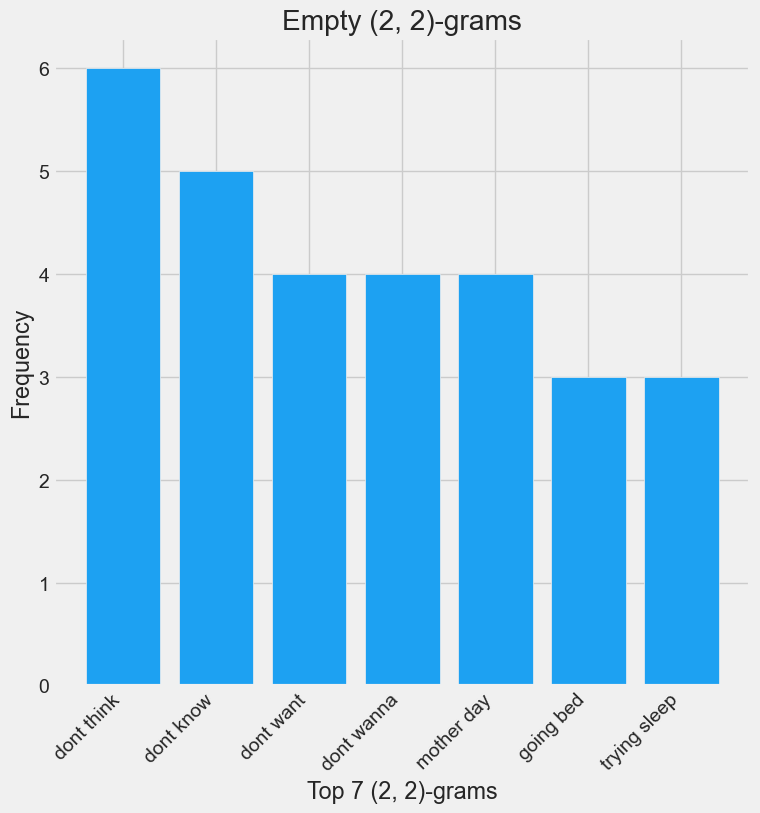

[('happy mother day', 3), ('know listenin bad', 1), ('listenin bad habit', 1), ('bad habit earlier', 1), ('habit earlier started', 1), ('earlier started freakin', 1), ('middle school elem', 1)]


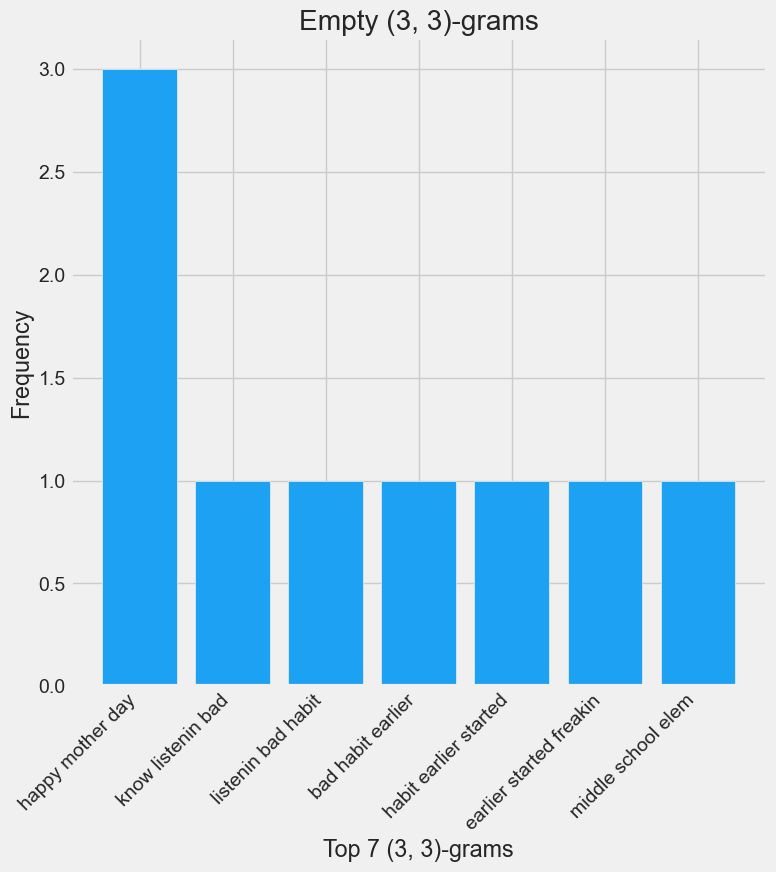

[('good', 55), ('want', 52), ('day', 50), ('work', 40), ('like', 36), ('today', 35), ('new', 34)]


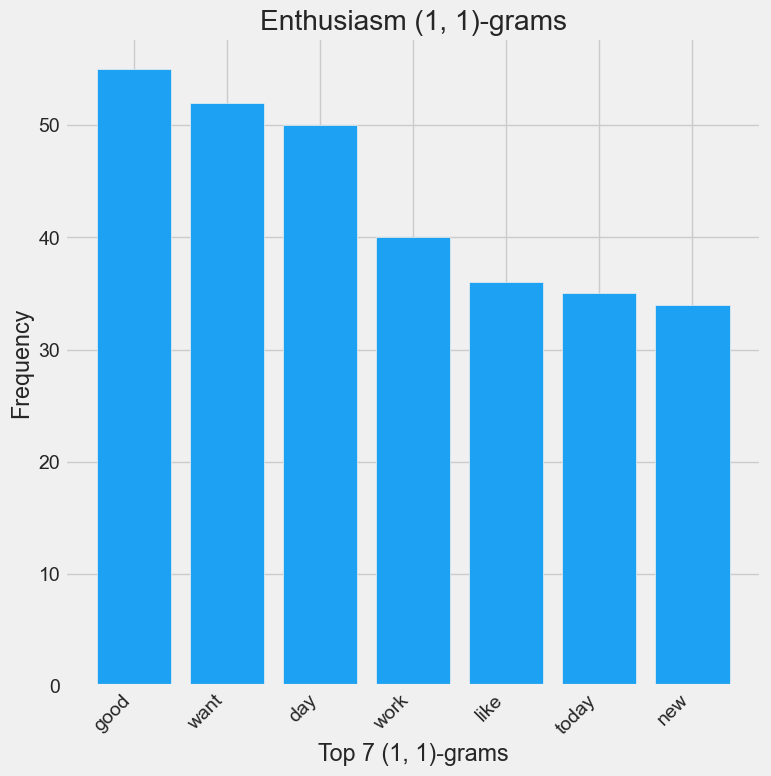

[('good morning', 11), ('looking forward', 8), ('mother day', 7), ('let know', 5), ('really want', 5), ('look like', 5), ('star trek', 5)]


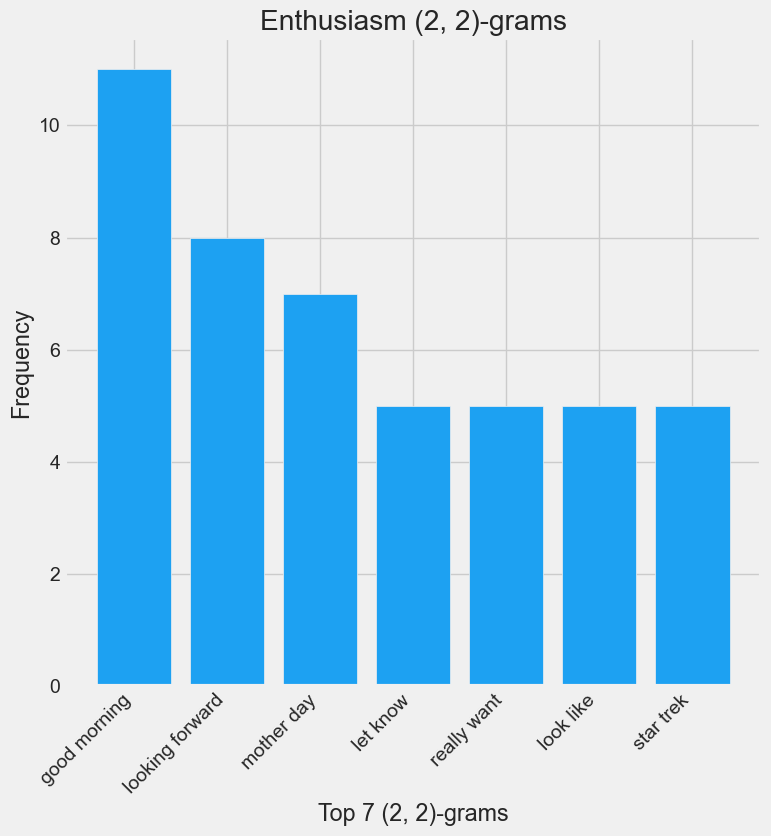

[('happy mother day', 4), ('really really want', 2), ('hi uploaded completely', 2), ('uploaded completely new', 2), ('completely new chinese', 2), ('new chinese lesson', 2), ('chinese lesson wwwyoutubecomchineselearn', 2)]


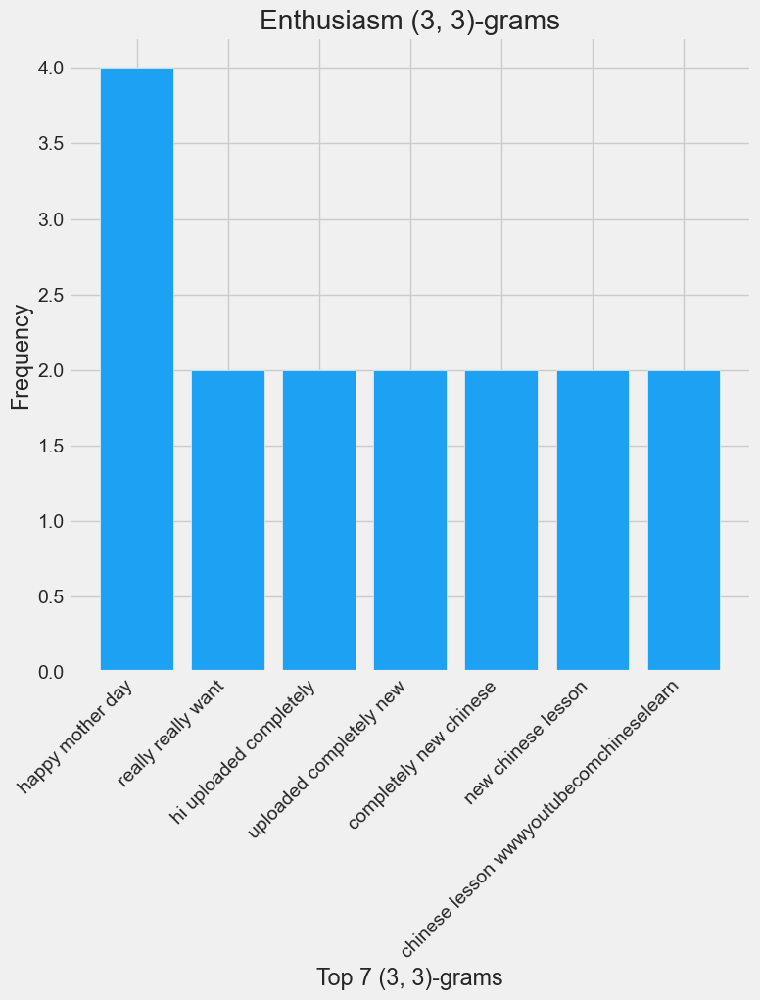

[('bored', 27), ('work', 15), ('really', 12), ('like', 12), ('dont', 11), ('tired', 10), ('today', 9)]


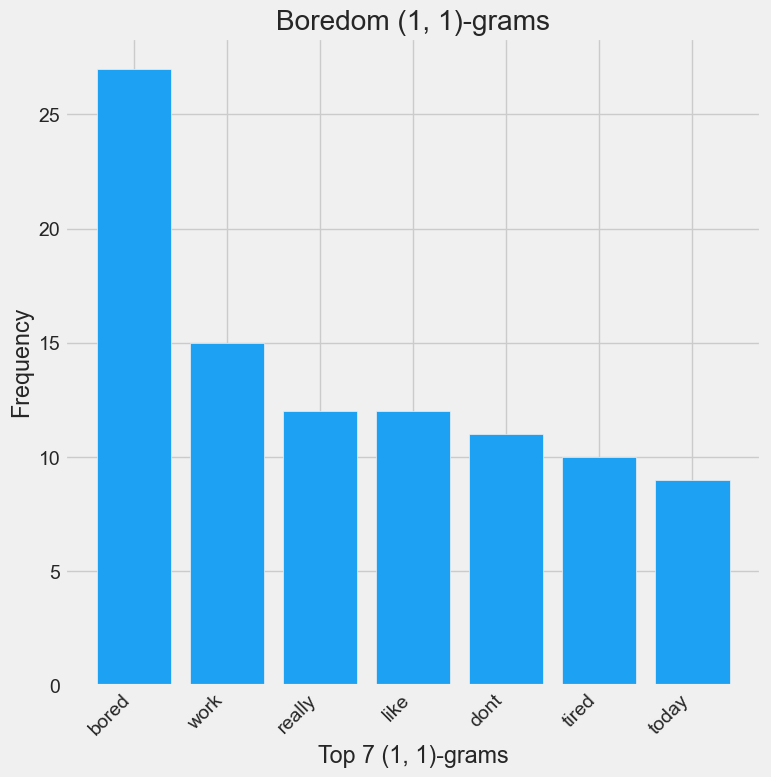

[('dont know', 4), ('feel like', 4), ('really bored', 3), ('dont like', 3), ('really really', 2), ('bored guess', 2), ('know today', 2)]


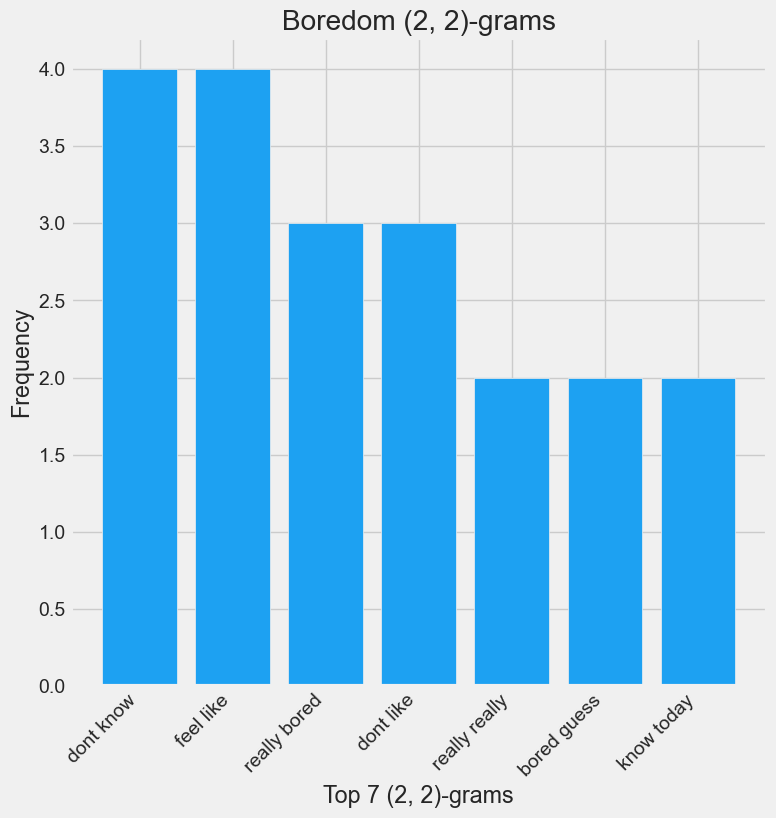

[('waiting line tryst', 1), ('agree work double', 1), ('work double shift', 1), ('really really bored', 1), ('really bored guess', 1), ('bored guess bed', 1), ('deep priecing soul', 1)]


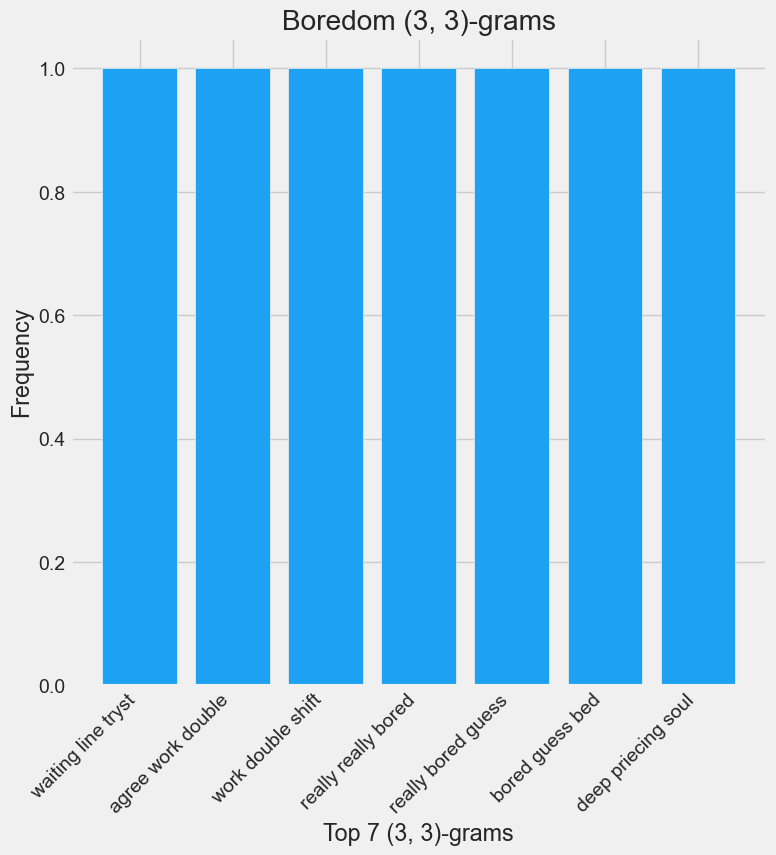

[('dont', 7), ('day', 7), ('know', 7), ('work', 6), ('like', 5), ('got', 5), ('good', 5)]


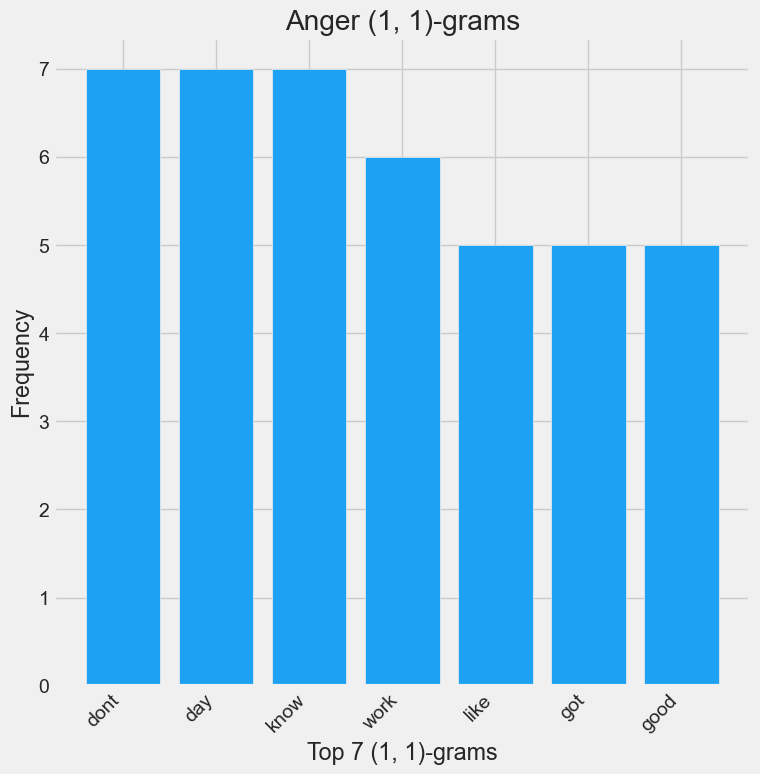

[('look like', 2), ('fuckinm transtelecom', 1), ('working fridaaaayyyyy', 1), ('packing dont', 1), ('dont like', 1), ('tried dye', 1), ('dye hair', 1)]


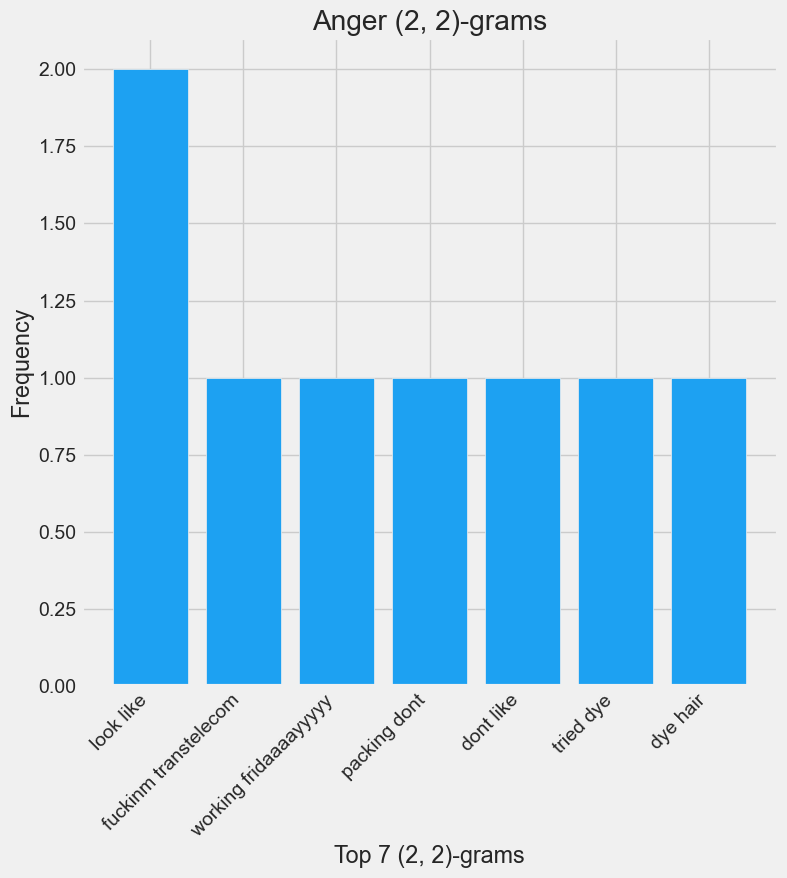

[('packing dont like', 1), ('tried dye hair', 1), ('dye hair got', 1), ('hair got blond', 1), ('got blond chunk', 1), ('blond chunk middle', 1), ('chunk middle hair', 1)]


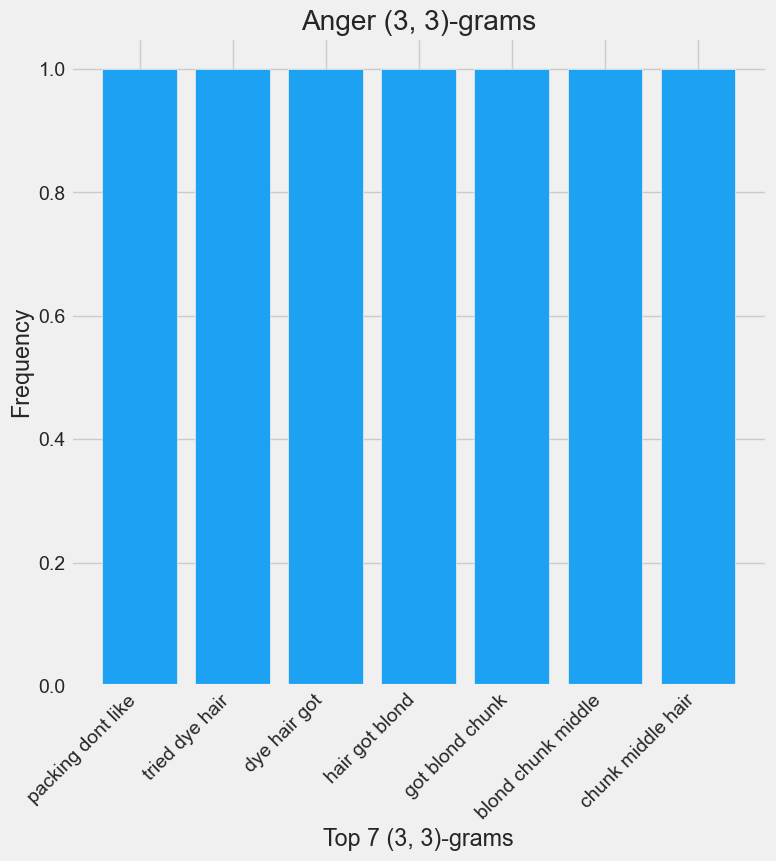

In [133]:
def plot_ngrams(emotion, ngram_range, n=7):
    # Obtener los n-gramas
    ngrams = get_top_n_gram(emotion_data[emotion_data['sentiment_label'] == emotion]['processed_tweet'].values, ngram_range,       n)
    print(ngrams)

    # Crear un DataFrame con los n-gramas y sus frecuencias
    df = pd.DataFrame(ngrams, columns=['ngram', 'frequency'])

    # Plotear el gráfico de barras
    plt.figure(figsize=(8, 8))
    plt.bar(df['ngram'], df['frequency'], color=twitter_colors)
    plt.xticks(rotation=45, ha='right')
    plt.title(f"{emotion.capitalize()} {ngram_range}-grams")
    plt.xlabel(f"Top {n} {ngram_range}-grams")
    plt.ylabel("Frequency")
    plt.show()
    
# Iterar sobre cada emoción y plotear los gráficos
for emotion in emotions:
    plot_ngrams(emotion, (1, 1))
    plot_ngrams(emotion, (2, 2))
    plot_ngrams(emotion, (3, 3))

In [129]:
 ngrams

[('day', 440),
 ('good', 355),
 ('work', 351),
 ('like', 343),
 ('going', 314),
 ('dont', 296),
 ('know', 281)]

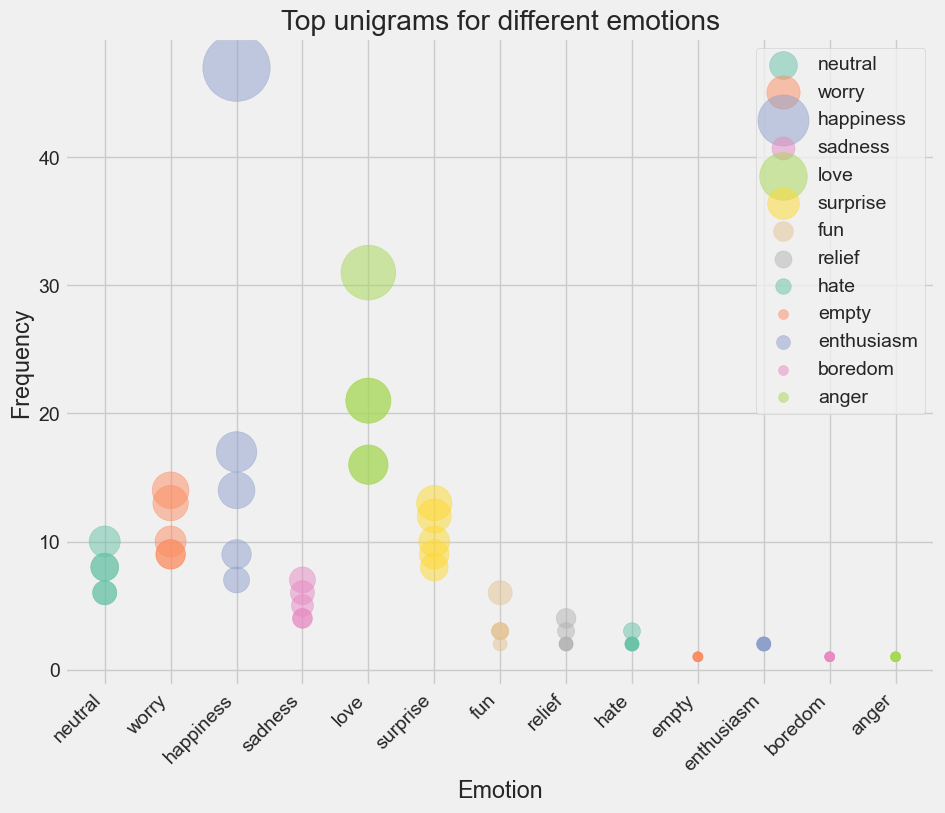

In [111]:
# Crear listas de datos para el gráfico
emotions = ['neutral', 'worry', 'happiness', 'sadness', 'love', 'surprise', 'fun', 'relief', 'hate', 'empty', 'enthusiasm', 'boredom', 'anger']

unigram_freqs = [neutral_unigrams, worry_unigrams, happiness_unigrams, sadness_unigrams, love_unigrams, surprise_unigrams,                      fun_unigrams, relief_unigrams, hate_unigrams, empty_unigrams, enthusiasm_unigrams, boredom_unigrams,                          anger_unigrams]

# Crear el gráfico de burbujas
fig, ax = plt.subplots(figsize=(10, 8))

for i, emotion in enumerate(emotions):
    x = [emotion] * len(unigram_freqs[i])
    y = [unigram_freq[1] for unigram_freq in unigram_freqs[i]]
    sizes = [unigram_freq[1] * 50 for unigram_freq in unigram_freqs[i]]  # Ajustar el tamaño de la burbuja
    
    ax.scatter(x, y, s=sizes, alpha=0.5, label=emotion)

plt.xticks(rotation=45, ha='right')
plt.xlabel('Emotion')
plt.ylabel('Frequency')
plt.title('Top n-grams for different emotions')

plt.legend()
plt.show()

**Observacion:** Estos gráficos muestran los n-gramas más frecuentes en los tweets clasificados por diferentes emociones. Los n-gramas son secuencias de palabras consecutivas de longitud n, y la frecuencia se refiere a cuántas veces aparece esa secuencia en los tweets de una emoción particular. El análisis de n-gramas puede ayudar a identificar las palabras o frases más asociadas con una emoción específica. 

Por ejemplo, el análisis muestra que para la emoción "feliz" los n-gramas más frecuentes son "día", "bueno" y "feliz", mientras que para la emoción "tristeza" son "no sé", "parece" y "trabajo". Este tipo de análisis puede ser útil para comprender cómo las personas expresan diferentes emociones en las redes sociales y para informar sobre la estrategia de marketing o publicidad en línea.

## 4. Observaciones generales

* El desbalance significativo entre las etiquetas de emociones en el conjunto de datos puede afectar negativamente el rendimiento de los algoritmos de machine learning utilizados para el análisis de sentimientos. 

* La longitud del tweet no afecta significativamente la emoción expresada en el mismo.

* Los resultados sugieren que la clasificación de emociones del conjunto de datos original no está completamente en línea con las emociones identificadas en el análisis de sentimiento.

* Vader puede ser más adecuado para textos cortos, como los tweets, debido a que está diseñado para analizar el lenguaje informal y el uso de emociones.

* Los textos con polaridad negativa parecen ser más objetivos que subjetivos, ya que están más concentrados en la parte inferior del gráfico.

* Las palabras más comunes asociadas con la tristeza incluyen "amor", "siempre", "hoy", "día", "vida", "triste", "familia", "nadie", "solo" y "verdad".

* Las palabras más comunes asociadas con la felicidad incluyen "vida", "amor", "hoy", "siempre", "familia", "gracias", "mundo", "día", "buen" y "ser".

* Estos gráficos de barras son una herramienta visual útil para identificar patrones de lenguaje en un conjunto de datos de tweets.

* El proceso de preprocesamiento de texto para dividir los tweets en palabras y contar su frecuencia es una técnica efectiva para analizar grandes conjuntos de datos de texto.

* La selección de las 10 palabras más comunes para cada emoción es suficiente para tener una idea general de las palabras asociadas con cada sentimiento.

* Este análisis podría ser útil en campos como la psicología, la publicidad o la mercadotecnia para entender mejor cómo el lenguaje y las palabras utilizadas en las redes sociales están relacionadas con las emociones.

* La frecuencia de n-gramas en los tweets clasificados por diferentes emociones puede ayudar a identificar las palabras o frases más asociadas con una emoción específica. Este tipo de análisis puede ser útil para comprender cómo las personas expresan diferentes emociones en las redes sociales y para informar sobre la estrategia de marketing o publicidad en línea.